# Customer Churn Analysis
by: [Phuong Nhi](https://www.linkedin.com/in/phuong-nhi-jade/)

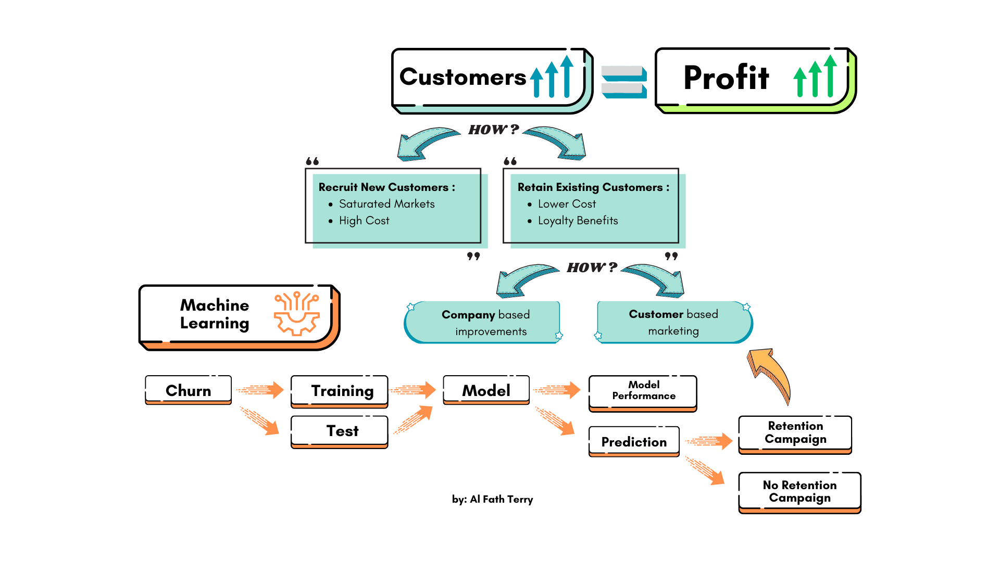

Source data:
- https://www.kaggle.com/datasets/blastchar/telco-customer-churn
- https://www.kaggle.com/datasets/ylchang/telco-customer-churn-1113

# **1. Import libraries**

In [45]:
import numpy
import shap
import sys
print("NumPy Version:", numpy.__version__)  # Kiểm tra lại phiên bản NumPy
print("Python Path:", sys.executable)  # Đường dẫn đến Python đang chạy


NumPy Version: 1.26.4
Python Path: /usr/local/bin/python3.12


In [46]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_rows')
import matplotlib.pyplot as plt
import matplotlib as mpl 
import seaborn as sns
sns.set_theme(style='white') 
%matplotlib inline
import re
import math 
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import six  
from numpy import random as rand 
import plotly.io as pio
pio.renderers.default = "notebook_connected"
import plotly.figure_factory as ff

import plotly.figure_factory as ff
from sklearn.preprocessing import PowerTransformer,FunctionTransformer, KBinsDiscretizer,OrdinalEncoder, OneHotEncoder, LabelEncoder,StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mutual_info_score, f1_score,recall_score, precision_score, confusion_matrix, ConfusionMatrixDisplay, classification_report,mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error , roc_auc_score,auc, roc_curve,balanced_accuracy_score
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression,SelectKBest, f_classif, f_regression,chi2, SelectPercentile,RFE, VarianceThreshold
from sklearn.model_selection import cross_val_score, cross_validate,StratifiedKFold,GridSearchCV,train_test_split
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering
from sklearn.utils.class_weight import compute_class_weight
import shap 
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, VotingClassifier

import xgboost as xgb
from catboost import CatBoostClassifier
from kmodes.kprototypes import KPrototypes
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.svm import SVC
from scipy.stats import shapiro, normaltest
from itertools import combinations
from scipy.stats import chi2_contingency,wilcoxon, mannwhitneyu, skew
import scipy.stats as ss
from IPython.display import Image 
import statsmodels.api as sm 
import warnings
warnings.filterwarnings("ignore")

# **2. Import dataset**

In [47]:

df_telco = pd.read_excel('/Users/mac/Downloads/telco/DATA/Telco_customer_churn.xlsx').drop(columns=['Count','Country','State', 'Zip Code','Lat Long','Latitude','Longitude','Payment Method','Churn Label'])
df_demo = pd.read_excel('/Users/mac/Downloads/telco/DATA/Telco_customer_churn_demographics.xlsx').drop(columns=['Gender','Senior Citizen','Dependents','Under 30','Count']).rename(columns={'Customer ID':'CustomerID'})
df_services = pd.read_excel('/Users/mac/Downloads/telco/DATA/Telco_customer_churn_services.xlsx').drop(columns=['Count','Quarter','Tenure in Months','Phone Service','Multiple Lines','Internet Type','Internet Service','Online Security','Online Backup','Device Protection Plan','Streaming TV','Streaming Movies','Contract','Paperless Billing','Monthly Charge','Total Charges']).rename(columns={'Customer ID':'CustomerID'})
df_churn = pd.read_excel('/Users/mac/Downloads/telco/DATA/Telco_customer_churn_status.xlsx').drop(columns=['Count','Quarter','Churn Label','Churn Value','Churn Reason','Churn Score','CLTV']).rename(columns={'Customer ID':'CustomerID'})
df = pd.merge(left=df_telco,right=df_demo, on='CustomerID').merge(right=df_services, on='CustomerID').merge(right=df_churn,on='CustomerID').rename(columns={'Churn Value':'Churn'}).drop(columns=['CustomerID','City','Tech Support'])
demo_graph_var = ['Gender','Age','Senior Citizen', 'Married', 'Dependents','Number of Dependents']
services_var = ['Referred a Friend','Number of Referrals','Tenure Months','Offer','Phone Service','Avg Monthly Long Distance Charges','Multiple Lines','Internet Service','Avg Monthly GB Download','Online Security','Online Backup','Device Protection','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method','Monthly Charges','Total Charges','Total Refunds','Total Extra Data Charges','Total Long Distance Charges','Total Revenue']
df = df[demo_graph_var+services_var+['Churn Category']+['Churn']]

# **3. Exploratory data analysis**

Now, I will explore the data to gain insights about the data. 


### View top 5 rows of dataset

In [48]:
# preview the dataset #dữ liệu khách hàng chính

df_telco.head()
#Xóa các cột liên quan đến vị trí: Country, State, Zip Code, Lat Long, Latitude, Longitude.
#Xóa các cột không cần thiết khác: Count, Payment Method, Churn Label.


,CustomerID,City,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,Los Angeles,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,53.85,108.15,1,86,3239,Competitor made better offer
1,9237-HQITU,Los Angeles,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,70.70,151.65,1,67,2701,Moved
2,9305-CDSKC,Los Angeles,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,99.65,820.5,1,86,5372,Moved
3,7892-POOKP,Los Angeles,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,104.80,3046.05,1,84,5003,Moved
4,0280-XJGEX,Los Angeles,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,103.70,5036.3,1,89,5340,Competitor had better devices


In [49]:
# preview the dataset #dữ liệu nhân khẩu học
df_demo.head()
#Xóa các cột nhân khẩu học không cần thiết: Gender, Senior Citizen, Dependents, Under 30, Count.
#Đổi tên cột Customer ID thành CustomerID để dễ kết hợp với các bảng khác.

,CustomerID,Age,Married,Number of Dependents
0,8779-QRDMV,78,No,0
1,7495-OOKFY,74,Yes,1
2,1658-BYGOY,71,No,3
3,4598-XLKNJ,78,Yes,1
4,4846-WHAFZ,80,Yes,1


### Rename/drop and merge 

• Merge data by CustomerID to create a full DataFrame df.

• Rename Churn Value to Churn/ 	Rename Customer ID to CustomerID for easy data integration.

• Delete unnecessary columns: CustomerID (used for merge), City, Tech Support.

- demo_graph_var: Demographic variables such as Gender, Age, Married, etc.

- services_var: Variables related to the services customers use.

- only keep the important columns for churn analysis, including Churn Category and Churn.

# **4. Data Understanding**

1️⃣ Demographic Variables (demo_graph_var)

Demographic characteristics that may influence customer churn behavior.

🔹 Gender: Helps to check if there is a difference in churn rates between men and women.

🔹 Age: Older customers may have higher loyalty than younger customers.

🔹 Senior Citizen: This group of customers may be less likely to change service providers.

🔹 Married: Married people may be more loyal due to using the service with their family.

🔹 Dependents & Number of Dependents: Families with dependents may be less likely to churn because they need stability.

⏩ Summary: This group of variables helps understand which **customer characteristics are more likely to churn.**

2️⃣ Service Variable Group (services_var)

Analyzing the type of services a customer uses can help determine which services may be related to churn.

🔹 Level of engagement with the company
- Referred a Friend: Customers who refer friends may have lower churn rates because they are satisfied with the service.

- Number of Referrals: The number of referrals may be related to loyalty.

🔹 Length of service
- Tenure Months: Long-term customers may be less likely to churn than new customers.

🔹 Service the customer signs up for
- Offers: Offers that may influence the decision to continue using the service.

- Phone Service, Multiple Lines: Customers who use multiple services may be less likely to churn.

- Internet Service: The type of internet may influence the experience and churn.
- Streaming TV, Streaming Movies, Streaming Music: If customers subscribe to multiple entertainment services, they may be less likely to churn.

- Unlimited Data: Customers with unlimited data plans may be more satisfied.

🔹 Costs and Payments
- Monthly Charges, Total Charges: Monthly charges and total spending may be related to churn (if costs are high, customers may leave).

- Total Refunds, Total Extra Data Charges, Total Long Distance Charges, Total Revenue: Refunds, additional fees may affect churn.

⏩ Summary: This group of variables helps assess how service types and costs affect churn.

3️⃣ Churn Category, Churn

- Churn: Target variable to predict whether customers will churn or not.

- Churn Category: Main reasons why customers churn (such as high prices, poor service, technical issues, etc.).

⏩ Summary: This group of variables helps analyze the causes of churn and build a churn prediction model.

In [50]:
print('Rows :',df.shape[0])
print('Columns :',df.shape[1]) 

Rows : 7043
Columns : 34


### View summary of dataset


In [51]:
# view summary of dataset
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             7043 non-null   object 
 1   Age                                7043 non-null   int64  
 2   Senior Citizen                     7043 non-null   object 
 3   Married                            7043 non-null   object 
 4   Dependents                         7043 non-null   object 
 5   Number of Dependents               7043 non-null   int64  
 6   Referred a Friend                  7043 non-null   object 
 7   Number of Referrals                7043 non-null   int64  
 8   Tenure Months                      7043 non-null   int64  
 9   Offer                              3166 non-null   object 
 10  Phone Service                      7043 non-null   object 
 11  Avg Monthly Long Distance Charges  7043 non-null   float

There is a data type mismatch, 'TotalCharges' should be numeric. and 'SeniorCitizen' can be changed to boolean or categorical.

## Missing values

In [52]:
miss_val = df[pd.to_numeric(df['Total Charges'], errors='coerce').isnull() == True]
miss_val.shape 

(11, 34)

Based on the above findings, the column 'TotalCharges' should be a numeric data type and not an object. Therefore, we have to identify which index has non-numeric values ​​and as a result, there are 11 rows of data missing values ​​in the column 'TotalCharges', if we look at the column 'Tenure' it is also 0, which is unreasonable so we have to delete this data.

In [53]:
# drop index whose value is unclear
df = df.drop(index=miss_val.index).reset_index(drop=True)
# change the data type of the 'TotalCharges' column to float
df['Total Charges'] = df['Total Charges'].astype(float)

In [54]:
df.isnull().sum() 

Gender                                  0
Age                                     0
Senior Citizen                          0
Married                                 0
Dependents                              0
Number of Dependents                    0
Referred a Friend                       0
Number of Referrals                     0
Tenure Months                           0
Offer                                3869
Phone Service                           0
Avg Monthly Long Distance Charges       0
Multiple Lines                          0
Internet Service                        0
Avg Monthly GB Download                 0
Online Security                         0
Online Backup                           0
Device Protection                       0
Premium Tech Support                    0
Streaming TV                            0
Streaming Movies                        0
Streaming Music                         0
Unlimited Data                          0
Contract                          

### Check data types of columns of dataframe

In [55]:
df.dtypes

Gender                                object
Age                                    int64
Senior Citizen                        object
Married                               object
Dependents                            object
Number of Dependents                   int64
Referred a Friend                     object
Number of Referrals                    int64
Tenure Months                          int64
Offer                                 object
Phone Service                         object
Avg Monthly Long Distance Charges    float64
Multiple Lines                        object
Internet Service                      object
Avg Monthly GB Download                int64
Online Security                       object
Online Backup                         object
Device Protection                     object
Premium Tech Support                  object
Streaming TV                          object
Streaming Movies                      object
Streaming Music                       object
Unlimited 

- In the “Churn Category” column, there are 5163 missing values, which correspond to customers who did not churn. This means that these customers did not have a reason to churn, so we can replace the missing values ​​with “no reason” to make it clearer.

- Similarly, the “Offer” column has many missing values, which can be understood as those customers did not receive any offers. Therefore, we can replace the missing values ​​in this column with “None” to show that they did not receive any special offers.

In [56]:
df['Churn Category'] = df['Churn Category'].replace({np.NaN:'no reason'}) 
df['Offer'] = df['Offer'].replace({np.NaN:'None'})

## Split the data into two main groups: 

- Numeric variables (numeric_var): Used for quantitative analysis (e.g. calculating average revenue).
- Categorical variables (categorical_var): Used for qualitative analysis (e.g. grouping customers by contract type).

In [57]:
numeric_var =['Age','Number of Dependents','Number of Referrals','Tenure Months','Avg Monthly Long Distance Charges','Avg Monthly GB Download','Monthly Charges','Total Charges','Total Refunds','Total Extra Data Charges','Total Long Distance Charges','Total Revenue'] 
categoric_var = [i for i in df.columns if i not in numeric_var + ['Churn']]

In [58]:
# analysis to see the cardinality of categorical data
for i in categoric_var:
    print('Variable :',i)
    print('Unique Values :',df[i].unique())
    print('Number of Unique Values :',df[i].nunique())
    print('\n') 

Variable : Gender
Unique Values : ['Male' 'Female']
Number of Unique Values : 2


Variable : Senior Citizen
Unique Values : ['No' 'Yes']
Number of Unique Values : 2


Variable : Married
Unique Values : ['No' 'Yes']
Number of Unique Values : 2


Variable : Dependents
Unique Values : ['No' 'Yes']
Number of Unique Values : 2


Variable : Referred a Friend
Unique Values : ['No' 'Yes']
Number of Unique Values : 2


Variable : Offer
Unique Values : ['None' 'Offer C' 'Offer E' 'Offer D' 'Offer A' 'Offer B']
Number of Unique Values : 6


Variable : Phone Service
Unique Values : ['Yes' 'No']
Number of Unique Values : 2


Variable : Multiple Lines
Unique Values : ['No' 'Yes' 'No phone service']
Number of Unique Values : 3


Variable : Internet Service
Unique Values : ['DSL' 'Fiber optic' 'No']
Number of Unique Values : 3


Variable : Online Security
Unique Values : ['Yes' 'No' 'No internet service']
Number of Unique Values : 3


Variable : Online Backup
Unique Values : ['Yes' 'No' 'No internet s

High cardinality is a condition where categorical data has too many unique values, such as city name, occupation, etc.

This condition affects the way we encode the data. If a feature has high cardinality, we cannot use One-hot encoding because:

- The number of columns created is too large, increasing the computational cost.

It can lead to the curse of dimensionality, making it difficult for the model to learn rules from the data.

In this dataset, the categorical variables do not have high cardinality, so there is no need to worry about this problem.

#### *Function*

In [59]:
# I will put some functions here so as not to interfere

# function to calculate categorical data associations
def get_corr_mat(df, f=chi2_contingency):
        columns = df.columns
        dm = pd.DataFrame(index=columns, columns=columns)
        for var1, var2 in combinations(columns, 2):
            cont_table = pd.crosstab(df[var1], df[var2], margins=False)
            chi2_stat = cramers_v(cont_table.values)
            dm.loc[var2, var1] = chi2_stat
            dm.loc[var1, var2] = chi2_stat
        dm.fillna(1, inplace=True)
        return dm

def cramers_v(confusion_matrix):
        """ calculate Cramers V statistic for categorial-categorial association.
            uses correction from Bergsma and Wicher,
            Journal of the Korean Statistical Society 42 (2013): 323-328
        """
        chi2 = ss.chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape
        phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
        rcorr = r - ((r-1)**2)/(n-1)
        kcorr = k - ((k-1)**2)/(n-1)
        return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# categorical data visualization function
cmp = 'Spectral'
def cat_viz(list_of_var):
    dem_viz = list_of_var
    bucket1 = [] 
    bucket2 = []
    bucket3 = []
    bucket4 = []
    for i in dem_viz:
        bucket1 = bucket1 +[i]*len(df[i].unique())
        for y in df[i].unique():
            bucket2.append(y)
            bucket3.append(df[(df['Churn']==1)&(df[i]==y)][i].count())
            bucket4.append(df[(df['Churn']==0)&(df[i]==y)][i].count())
    bucket5 = []
    for i ,j in zip(bucket4,bucket3):
        bucket5.append([round((i/(i+j))*100,2),round((j/(i+j))*100,2)])
    fig = go.Figure()
    # Not Churn
    fig.add_trace(go.Bar(x = [bucket1,bucket2],y = bucket4,marker_color=main_color[0],name = "Not Churn",text=[  f"{j}<br>%{i[0]}" for i,j in zip(bucket5,bucket4)]))
    # Churn
    fig.add_trace(go.Bar(x = [bucket1,bucket2],y = bucket3,marker_color=main_color[1],name = "Churn",text=[  f"{j} <br> %{i[1]}" for i,j in zip(bucket5,bucket3)]))
    fig.update_layout(title_text="Demographics Categorical Data vs Churn",title_x=0.5,title_y= 0.97, template='plotly_white') 
    # fig.show()

    cat_corr= get_corr_mat(df[list_of_var + ['Churn']])
    plt.figure(figsize=(5,5))
    sns.heatmap(cat_corr, cbar=True, annot=True, fmt='.2f',  square=True, annot_kws={'size': 12}, cmap='Blues', linecolor='white')
    # plt.show();
    return fig

# function to create a churn reason report in the form of a dataframe
def churn_reason_report(var,unique_val):
    filter_ = (df[var] == unique_val) & (df['Churn']==1)
    count = df[filter_]['Churn Category'].value_counts().to_frame()
    percentage = df[filter_]['Churn Category'].value_counts(normalize=True).to_frame().round(2)
    frame = pd.concat([count,percentage],axis=1).reset_index().set_axis(["Churn Reason",'Count','%'],axis=1)
    # frame.columns = pd.MultiIndex.from_arrays([[f"({var} == {unique_val})",''] , ['Count','%']])
    return frame

# function for visualization of numeric data
def num_viz(var):
        skew_ = round(skew(df[var], bias=False),3)
        fig = px.histogram(
                    df, x=var,
                    marginal="box", 
                    hover_data=df.columns, 
                    template='simple_white',
                    color='Churn',
                    color_discrete_map = {0:main_color[0],1:main_color[1]} 
                ).update_layout(autosize=True,
                    height=360, 
                    width=900,
                    margin=dict(l=0,r=20,b=0,t=30,pad=10),
                    title_text='<b>{title} | skewness : {skew}'.format(title=var, skew=skew_), 
                    title_x=0.5, 
                    title_y= 0.97, 
                    template='plotly_white'
                    )
        return fig 

# **5. Exploratory data analysis**

In general, we will divide the EDA stages into two, the first is to find business insights, the second is EDA for modeling.

## 1. Business Insights

In [60]:
df.rename(columns={'Churn Label': 'Churn'}, inplace=True)

In [61]:
main_color = ['#26577C','#E55604']

df_t = df['Churn'].value_counts().reset_index().set_axis(['Churn', 'Count'], axis=1)
df_t['Churn'] = df_t['Churn'].replace({0: 'Not Churn', 1: 'Churn'})

z = [main_color[0], main_color[1]]

fig = go.Figure(
    data=[go.Pie(labels=df_t['Churn'], values=df_t['Count'], hole=.3)]
).update_layout(
    height=550,
    title={'text': 'Customer Churn', 'y': 0.96, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
    font=dict(size=15),
    template='plotly_white'
).update_traces(marker=dict(colors=z))  # Đúng cú pháp

fig.show()

In the business world, there are two popular strategies: acquisition and retention. Customer acquisition strategy is a strategy that aims to get new customers. Meanwhile, customer retention strategy is a strategy that aims to retain old customers. Both have an equally important role, without one of them, the business will not run well.

To be able to enter the market competition and make a profit, a business must have customers. A business must have at least a few customers when it is launched. Customer acquisition strategy helps increase the number of customers and enlarge the customer base that is starting to form.

In the case of acquisition, it is possible that the acquisition costs do not actually generate profit. Only a few months or even years later, with strong retention, the relationship with customers begins to generate significant profits.

Why do we need to do customer retention?

acquisition strategy is considered much more expensive than retention strategy. This is not just speculation. In an article, Forbes, shows how acquisition can be 5 times more expensive than retention, making new customers loyal is also 16 times more expensive, and just 5% increase in retention efforts can increase profits by up to 95%. Why can this happen? This is because customers have never had any experience and have not yet created trust in our business. Businesses need time and money to make customers interested and confident to buy. So, a strategy is needed to stop customer churn and retain existing customers, because they are the main source of business revenue.

Because of this, we will try to create a Machine Learning model that is useful for detecting customers who have the potential to Churn in the future, along with an analysis of the churn phenomenon that occurs in this company.

summary :
- Problem = Customer churn.
- Goals = Reducing the number of customers who Churn.
- Objective = Create a Machine Learning model and also analyze Data.
- Business Metrics = Revenue and Churn Rate

Basically, the data contained in this data can be grouped into 3 categories, namely demographic data, company service data, and economic value. Due to the large amount of data available, we will focus on the relationship of each category to churn.

In [62]:
demog = ['Gender','Age','Married','Number of Dependents','Dependents','Number of Referrals','Referred a Friend']
serv = ['Phone Service','Multiple Lines','Internet Service','Online Security','Online Backup','Device Protection','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data']
serv2 = ['Contract','Paperless Billing','Payment Method','Offer']
value = ['Tenure Months','Total Charges','Monthly Charges','Total Extra Data Charges','Total Long Distance Charges','Total Refunds','Total Revenue'] 

## *New Feature*

After understanding the data, we will create 3 new features, namely: Services Usage, Monetary Value, and Customer Score.
- Services Usage is the number of services that customers use.
- Monetary value is the calculation of the number of Charges that enter the company, divided by 1000 so that the scale unit is the same as the Number of Referrals and Services Usage.
- Cust Score is the assignment of scores to customers based on the number of Services usage, Number of Referrals and Monetary Value.

these features will be useful when we want to segment customers later.

In [63]:
map_serv = {'Yes':1,'No':0,'No phone service':0,'DSL':1,'Fiber optic':1,'No internet service':0} 
#Calculate the number of services that customers use
df['Services_Usage'] = pd.DataFrame([df[i].map(map_serv) for i in serv ]).T.sum(axis=1) 

#Calculate customer score (Cust_Score)
df['Cust_Score'] = df['Services_Usage'] + df['Number of Referrals'] + (df['Total Revenue'] /1000).round(2)

numeric_var = numeric_var + ['Services_Usage','Cust_Score'] 

- Services_Usage – Customer service usage index
- Cust_Score – Aggregate score based on service usage, referrals, and revenue

### A. Demographics

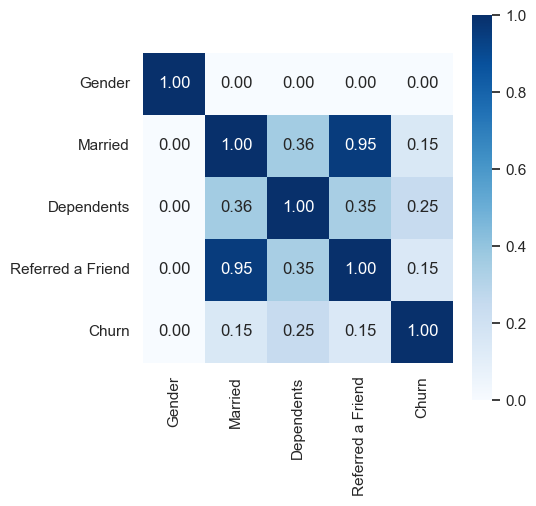

In [64]:
cat_viz(['Gender','Married','Dependents','Referred a Friend']).show() 

The proportion of Gender between Male and Female towards Churn looks identical, Gender has no association with customers who will churn or not, this is also supported by Cramer's v heatmap with a coefficient of 0 (Cramer's v is used to calculate the strength of association between categorical data).

While customers who do not have dependents and are not married are more likely to churn, this result is a little counter intuitive because if the customer does not have a partner and relatives, then the customer's money space should be wider and there is no need to churn, right? but this reason does not apply if the customer manages to find a better competitor. to be more certain, let's find out the cause

In [65]:
display( 
    churn_reason_report('Married','No'),
    churn_reason_report('Dependents','No')
    )

,Churn Reason,Count,%
0,Competitor,542,0.45
1,Attitude,206,0.17
2,Dissatisfaction,181,0.15
3,Price,143,0.12
4,Other,128,0.11


,Churn Reason,Count,%
0,Competitor,807,0.46
1,Attitude,293,0.17
2,Dissatisfaction,279,0.16
3,Price,195,0.11
4,Other,189,0.11


- The biggest reason customers leave is that they find a better competitor (45%), meaning businesses need to carefully study their competitors' strengths.

- Attitude and satisfaction also play a big role (32% of total churn), which suggests that customer experience needs to be improved.

- Price accounts for 12%, meaning there is a group of customers who are price-sensitive, but not the main factor.

In [66]:
for i in ['Age','Number of Dependents','Number of Referrals']:
    num_viz(i).show()

One of the most effective marketing strategies of all time is the Word of Mouth (WOM) strategy. A study of global customers shows that 92% of customers trust recommendations from family or friends more than advertising. When a business has a well-implemented retention strategy, customer satisfaction levels will increase. Satisfied customers are more likely to recommend a business to their family or friends. Customers who make a lot of referrals are one of the characteristics of customers who must be maintained so as not to churn. The 'Number of Referrals' will later be used as a calculation for customer segmentation, the higher the number the better.

### B. Services

In [67]:
# data frame untuk visualisasi Count of Services usage
df_serv = pd.DataFrame(pd.DataFrame([df[i].map(map_serv) for i in serv ]).T.sum(axis=0)).reset_index().set_axis(
    ['Services','Count'],axis=1).sort_values(by='Count',ascending=False,ignore_index=True)
df_serv['Color'] = main_color[0] 
df_serv['Color'][:3] = main_color[1] # highlight top 3 kolom terbaik

# visualisasi Count of Services usage
fig = go.Figure([go.Bar(y=df_serv['Services'], x=df_serv['Count'],text= [ '{a} (%{b})'.format(a=i,b=j) for i, j in zip(df_serv['Count'],[round((i / df_serv['Count'].sum())* 100,2) for i in df_serv['Count']])],
                        textposition='outside',
                        marker={'color': df_serv['Color']},
                        orientation='h')]) 
fig.update_layout(autosize=True,#width=1200,
                  height=500,margin=dict(l=10,r=10,b=10,t=40,pad=0),xaxis_range=[0,df_serv['Count'].max() + (df_serv['Count'].max()/2)],template='plotly_white',
        title=dict(text='Count of Services Usage',font=dict(size=20),x=0.5),
        yaxis={'categoryorder':'array','categoryarray':df_serv.sort_values(by='Count', ascending=True)['Services'].to_list()})  
fig.show()

Phone Service, Internet Service, and Unlimited Data are the 3 most popular services, next we will try to find out how these three variables relate to churn?

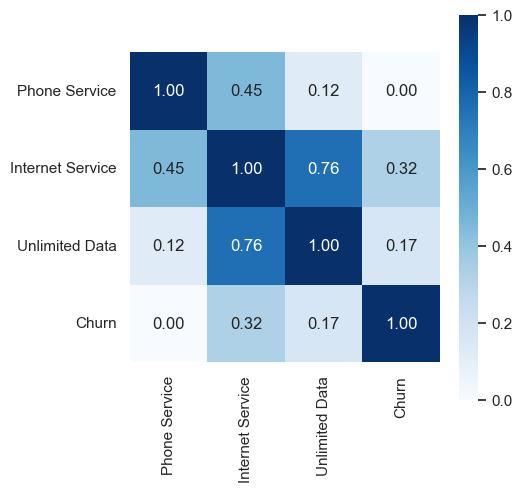

In [68]:
cat_viz(['Phone Service','Internet Service','Unlimited Data']).show()

Customers who use fiber optic internet services have a high chance of Churn, a brief explanation of the differences between Fiber Optic and DSL, Fiber Optic is a faster internet service than DSL. Is it because the speed of Fiber Optic in this company does not meet customer expectations?

In [69]:
fig = make_subplots(rows=1, cols=3,  specs=[[{"type": "pie"}, {"type": "pie"}, {"type": "pie"}]],subplot_titles=[ f'{i} Churn Category' for i in  ['Phone Service','Internet Service','Unlimited Data']]
)
for j,i in zip([1,2,3],['Phone Service','Internet Service','Unlimited Data']):
    df_o = df[['Churn Category',i,'Churn']]
    fig.add_trace(
        px.sunburst(df_o, path=[i, 'Churn Category'], values='Churn'
                        ).update_layout(height=550,title={'text': f'{i} Churn Category','y':0.96,'x':0.5,'xanchor': 'center','yanchor': 'top'},font=dict( size=15), template='plotly_white'
                                ).data[0],
        row=1, col=j
    )
fig.update_layout(height=550,sunburstcolorway = z)
fig.layout.annotations[0].update(y=1.1)
fig.layout.annotations[1].update(y=1.1)
fig.layout.annotations[2].update(y=1.1) 
fig.show()

The main reason why users of 'Phone Service', 'Internet Service', and 'Unlimited Data' services churn is due to competitors.

In [70]:
df_p = df['Churn Category'].value_counts().iloc[1:].reset_index().set_axis(['Churn Category','Count'],axis=1)
z = [main_color[0],main_color[1],'#CDC2AE','orange','#867070']
fig = go.Figure(data=[go.Pie(labels=df_p['Churn Category'], values=df_p['Count'], hole=.3)]
            ).update_layout(height=550,title={'text': 'Churn Category','y':0.96,'x':0.46,'xanchor': 'center','yanchor': 'top'},font=dict( size=15), template='plotly_white'
                            ).update_traces(marker=dict(colors=z))
fig.show()

Secara general penyebab utama customer menjadi churn karena kompetitor

### C. Monetary Value

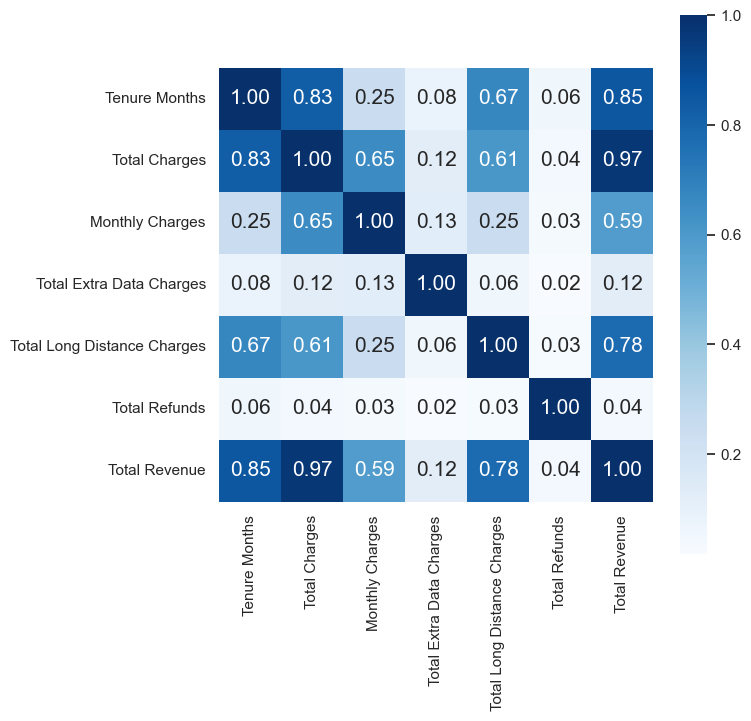

In [71]:
plt.figure(figsize=(7,7))
sns.heatmap(df[value].corr(), cbar=True, annot=True, fmt='.2f', square=True, annot_kws={'size': 15}, cmap='Blues',  linecolor='white')  
plt.show()

Total Revenue with Tenure Months has a fairly high correlation, let's analyze it in more depth.

In [72]:
fig = px.scatter(df[df['Churn']==1], x="Tenure Months", y="Total Revenue", color='Services_Usage',
                 size='Age',color_continuous_scale='Spectral').update_layout(template='plotly_white',height=400, title='Churn',title_x=0.5,title_y= 0.97)
fig2 = px.scatter(df[df['Churn']==0], x="Tenure Months", y="Total Revenue", color='Services_Usage',
                 size='Age', color_continuous_scale='Spectral').update_layout(template='plotly_white',height=400, title='Not Churn',title_x=0.5,title_y= 0.97)
fig.show()
fig2.show()

✅ The longer a customer stays with you (higher tenure), the higher your average total revenue.

✅ Customers who use more services also generate a significant increase in revenue.

✅ Customers with fewer services generate less revenue and are more likely to leave the service (higher churn risk).

✅ Data shows that upselling service opportunities can help increase revenue.

The company is quite good at retaining customers who spend little money, but is not very good at retaining customers who tend to have high Total Charges.

In [73]:
for i in ['Tenure Months','Monthly Charges','Total Charges','Total Revenue']:
    num_viz(i).show()

✅ Churn occurs mainly in the first 0-10 months, need to improve onboarding process or new customer retention program.

✅ Loyal customers (~70 months) almost never leave, can focus on upsell/cross-sell this group.

✅ Outliers (churn after 50+ months) need to consider the reason, can be due to price or service change.

------------------------------------
✅ High-paying customers (~70-120 USD) have a higher rate of spending, and may feel that the cost is not worth the service.

✅ Low-paying customers (~20 USD) are less likely to spend, and may not feel the financial burden is too heavy.

✅ Consider the value that customers receive when paying high fees, and consider whether incentives, customer care, or service quality should be improved for this group.

✅ Low-cost packages (~20 USD) may be retaining many customers, and can be leveraged to upsell or increase the value of services for this group.

------------------------------------

✅ Most customers have low total costs (under $1000) → They are probably new or early churners.

✅ The churners (orange) are concentrated in low total costs (< $1000).

✅ The non-churners (blue) have longer experiences and more customers with higher total costs (> $3000) → Loyal customers tend to have higher total costs.

✅ There are some exceptions with total costs > $6000, but there are still customers who churn at this level.

------------------------------------

✅ Similar distribution to Total Charges because total revenue is highly correlated with total costs.

✅ Most revenue comes from non-churn customers.

✅ Churn customers tend to leave when their total revenue is low.

If we look at the marginal boxplot visualization above, it can be seen that 'Tenure Months' and 'Monthly Charges' between those who churn and those who do not have different data distribution shapes. This is one indication that this feature will be a good predictor.

# **6. EDA for Machine Learning** 





### A. Numeric Data 

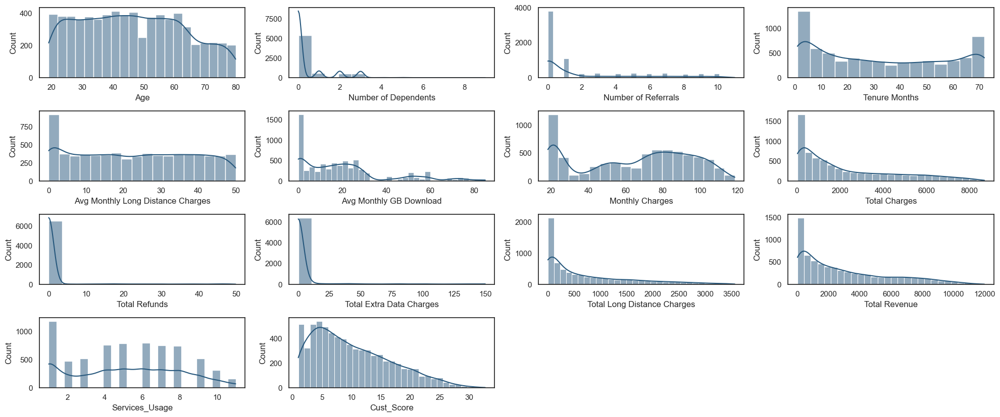

,Numeric Var,Skewness,Shapiro P-val,Conclusion,Outlier Count,Outlier %
0,Monthly Charges,-0.222,0.0,Tidak Normal,0,0.00
1,Avg Monthly Long Distance Charges,0.049,0.0,Tidak Normal,0,0.00
2,Services_Usage,0.066,0.0,Tidak Normal,0,0.00
3,Age,0.162,0.0,Tidak Normal,0,0.00
4,Tenure Months,0.238,0.0,Tidak Normal,0,0.00
5,Cust_Score,0.686,0.0,Tidak Normal,20,0.28
6,Total Revenue,0.917,0.0,Tidak Normal,21,0.30
7,Total Charges,0.962,0.0,Tidak Normal,0,0.00
8,Avg Monthly GB Download,1.216,0.0,Tidak Normal,362,5.15
9,Total Long Distance Charges,1.236,0.0,Tidak Normal,194,2.76


,Age,Number of Dependents,Number of Referrals,Tenure Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charges,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Services_Usage,Cust_Score
count,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,46.521331,0.467577,1.949232,32.421786,22.963471,20.531712,64.798208,2283.300441,1.965252,6.871445,749.957096,3038.163730,5.174915,10.162302
std,16.751596,0.962134,3.001324,24.545260,15.449368,20.419561,30.085974,2266.771362,7.908412,25.123141,847.025001,2865.830234,2.888652,6.581471
min,19.000000,0.000000,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,21.360000,1.000000,1.020000
25%,32.000000,0.000000,0.000000,9.000000,9.210000,3.000000,35.587500,401.450000,0.000000,0.000000,70.567500,607.275000,3.000000,4.827500
50%,46.000000,0.000000,0.000000,29.000000,22.890000,17.000000,70.350000,1397.475000,0.000000,0.000000,403.875000,2111.300000,5.000000,8.860000
75%,60.000000,0.000000,3.000000,55.000000,36.412500,27.000000,89.862500,3794.737500,0.000000,0.000000,1192.432500,4808.797500,7.000000,14.640000
max,80.000000,9.000000,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000,11.000000,32.690000


In [74]:
# function untuk mencari outlier
def find_outliers_IQR(Series):
   q1=Series.quantile(0.25)
   q3=Series.quantile(0.75)
   IQR=q3-q1 
   upper_bound = (q3+1.5*IQR) 
   lower_bound = (q1-1.5*IQR)
   outliers = Series[(Series<lower_bound) | (Series>upper_bound)]
   return outliers, lower_bound, upper_bound 

# plot distribusi data
plt.figure(figsize=(20,10))
for i in enumerate(numeric_var):
  plt.subplot(5,4,i[0]+1)
  sns.histplot(df[i[1]], kde=True,color=main_color[0])
plt.tight_layout()
plt.show()

# shapiro normality test
# asumsi : oberservasi ditiap sample adalah independen
# H0 : data berdistribusi normal jika pvalue >= 0.05 . dapat disimpulkan (dengan keyakinan sebesar 95%) bahwa variable ini berdistribusi Normal
# Ha : data tidak berdistribusi normal jika p value < 0.05

# Skewness = 0: Data berdistribusi normal.
# Skewness > 0: skew ke kanan / positif
# Skewness < 0: skew ke kiri / negatif

# dataframe untuk menjabarkan kondisi variable numerik 
num_conc = pd.DataFrame({
    'Numeric Var':numeric_var,
    'Skewness':[ round(skew(df[i], bias=False),3) for i in numeric_var],
    'Shapiro P-val': [ round(shapiro(df[i].sample(3000))[1],5) for i in numeric_var] ,
    'Conclusion': [ 'Normal' if shapiro(df[i].sample(3000))[1] >= 0.05 else 'Tidak Normal' for i in numeric_var],
    'Outlier Count': [find_outliers_IQR(df[i])[0].shape[0] for i in numeric_var],
    'Outlier %' : [ round((i / df.shape[0])*100,2) for i in [find_outliers_IQR(df[i])[0].shape[0] for i in numeric_var]]  
}).sort_values(by='Skewness', ignore_index=True)
display(num_conc,df[numeric_var].describe())


### Conclusion

- Some variables such as “Total Charges”, “Total Revenue” and “Monthly Charges” have a strong right skewed distribution, meaning that a small group of customers contributes the majority of revenue.
- “Tenure Months” shows that customers tend to leave early or become long-term customers, with few customers in the middle.
- “Number of Referrals” and “Total Refunds” show that the majority of customers do not refer more users and do not receive refunds.

### Conclusion 

-  All variables are not normally distributed, which may affect the use of statistical models that assume normal distribution (such as linear regression).
-  Variables such as Total Extra Data Charges, Total Refunds, and Number of Dependents have very high skewness, indicating that data transformations (log transformation, Box-Cox, or nonlinear modeling) should be considered.
-  Outliers are common in variables such as Number of Dependents, Total Extra Data Charges, Total Refunds, which may affect the model if not handled properly.

In [75]:
for i in ['Total Extra Data Charges','Total Refunds']: 
    print( "{} == 0 :".format(i),df[i].value_counts().head(1)[0], '| {persen} %'.format(persen=round((df[i].value_counts().head(1)[0]/df.shape[0])*100,3)))
    print("{} != 0 :".format(i), df[df[i] !=0].shape[0], '| {persen} %'.format(persen=round((df[df[i] !=0].shape[0] / df.shape[0]) * 100,3)))
    print('\n') 

Total Extra Data Charges == 0 : 6304 | 89.647 %
Total Extra Data Charges != 0 : 728 | 10.353 %


Total Refunds == 0 : 6507 | 92.534 %
Total Refunds != 0 : 525 | 7.466 %




- 89.647% khách hàng (6304 người) không có phí dữ liệu phát sinh thêm → Điều này cho thấy phần lớn khách hàng không sử dụng thêm dữ liệu ngoài gói của họ hoặc có thể có các chính sách giới hạn phí dữ liệu.
- 10.353% khách hàng (728 người) có phí dữ liệu phát sinh thêm → Đây có thể là nhóm khách hàng có nhu cầu sử dụng dữ liệu cao hơn, có khả năng sẵn sàng trả thêm tiền.

📌 Ý nghĩa:
- Có thể tìm hiểu xem nhóm khách hàng nào thường xuyên phát sinh phí dữ liệu này, liệu có liên quan đến churn (rời bỏ dịch vụ) hay không.
- Nếu đây là khách hàng trung thành, công ty có thể cung cấp các gói cước dữ liệu phù hợp để tối ưu doanh thu.

#### Hoàn tiền (Total Refunds)

- 92.534% khách hàng (6507 người) không nhận hoàn tiền → Hầu hết khách hàng không có giao dịch yêu cầu hoàn tiền, có thể do chính sách chặt chẽ hoặc ít vấn đề xảy ra.
- 7.466% khách hàng (525 người) nhận hoàn tiền → Đây là nhóm khách hàng có thể đã gặp vấn đề với dịch vụ, dẫn đến việc yêu cầu hoàn tiền.

📌 Ý nghĩa:
- Cần kiểm tra xem lý do hoàn tiền là gì: do khiếu nại, huỷ hợp đồng sớm hay lý do khác?
- Nếu tỷ lệ hoàn tiền cao trong một nhóm khách hàng cụ thể (ví dụ: khách hàng mới, khách hàng có giá trị cao), công ty cần đánh giá chính sách chăm sóc khách hàng và chất lượng dịch vụ.

Based on the results of the Normality Test conducted, it was concluded that all numeric features were not normally distributed, there were even features that had outliers of 23%. To overcome data that is not normally distributed and contains outliers, outliers will be handled using the IQR method (data that passes the lower bound and upper bound limits will be considered outliers), feature transformation (a technique for changing data distribution to approach normal), then feature scaling (equalizing the unit scale on all numeric features).

There are several common ways used to handle Outliers:
1. Remove outliers:
If we have a lot of data and the data that is included in the outlier does not represent the actual population conditions, we can do a drop.
2. Transform outliers:
The effects of outliers can be minimized using feature transformers such as log, yeo-johnson, etc. feature transformation is a method of changing data distribution to approach normal, this technique can reduce data skewness which results in reducing outliers.
3. Impute outliers:
In this case, outliers can be considered as missing values. We can apply various imputation techniques such as mean, median, mode, nearest neighbor, etc.
4. Replace outliers
We can replace outlier data with upper bound or lower bound IQR. for example, there is an outlier of 120 years old, we can replace it with 90 (for example, 90 is the upper bound).

- feature 'Number of Dependents' all numbers above 3 will be replaced with number 3.
- feature 'Total Extra Data Charges' and 'Total Refunds' will be binned and changed into categorical data, all numbers 0 will be changed to 'No', otherwise to 'Yes'.
- other features that contain outliers, the outliers will be considered as missing values ​​which will later be imputed using KNN Imputer.
- For Feature Transformation using 'Yeo-Johnson' with Feature Scaling 'Min-Max Scaler'


In [76]:
# upper bound feature that has outliers
out_var3 = ['Number of Referrals','Total Long Distance Charges','Avg Monthly GB Download','Total Revenue','Cust_Score']
# upper bound 
upper_bound = []
for i in out_var3:
    upper_bound.append(find_outliers_IQR(df[i])[2] ) 
for i,j in zip(out_var3,upper_bound):
    print(i,j) 

Number of Referrals 7.5
Total Long Distance Charges 2875.2299999999996
Avg Monthly GB Download 63.0
Total Revenue 11111.08125
Cust_Score 29.35875


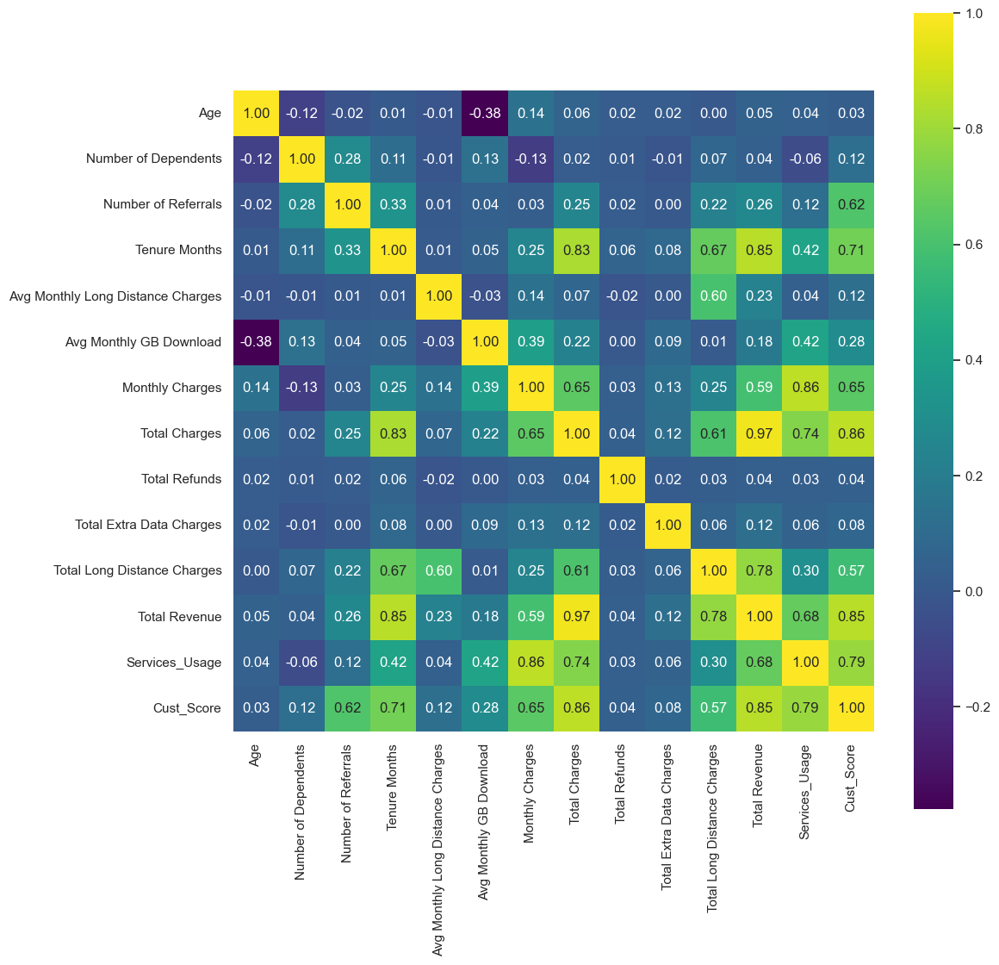

In [77]:
plt.figure(figsize=(12,12)) 
sns.heatmap(df[numeric_var].corr(), square=True,  
            annot=True, 
            fmt='.2f', 
            linecolor='white', 
            annot_kws={'size': 12}, 
            cmap='viridis'); 
plt.show()

Multicollinearity is a condition where independent variables are correlated with each other, but because multicollinearity does not affect the classification model, we will leave it alone.

### B. Categoric Data

In [78]:
df[categoric_var].describe() 

,Gender,Senior Citizen,Married,Dependents,Referred a Friend,Offer,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Churn Category
count,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032
unique,2,2,2,2,2,6,2,3,3,3,3,3,2,3,3,2,2,3,2,3,6
top,Male,No,No,No,No,None,Yes,No,Fiber optic,No,No,No,No,No,No,No,Yes,Month-to-month,Yes,Bank Withdrawal,no reason
freq,3549,5890,3639,5412,3819,3869,6352,3385,3096,3497,3087,3094,4992,2809,2781,4545,4740,3875,4168,3907,5163


For Categorical Data, it will be separated into two, Nominal and Ordinal
- Categorical Nominal will be encoded using One-Hot Encoder
- While for Categorical Ordinal data, it will be encoded using Ordinal Encoder

In [79]:
c = 3 # number of columns
r = 4 # number of rows
n_vr = 12 # number of variable 
h = [ ]
for i in range(c): # columns
    h.append({"type": "bar"})
w = []
for i in range(r): # rows 
    w.append(h)
fig = make_subplots(rows=r, cols=c,  specs=w,subplot_titles=serv[:n_vr])
indx = []
for x in range(1,r+1):
    for j in range(1,c+1):
        indx.append([x,j])  
for yy, i in zip(indx,serv[:n_vr]):
    df_bar100 = df.groupby(by=['Churn',i])['Age'].count().to_frame().reset_index().rename(columns={'Age':'Count'})
    df_bar100['Churn'] = df_bar100['Churn'].replace({0:'Not Churn',1:'Churn'})
    bucket_p = [] 
    for k in df_bar100['Churn'].unique().tolist():
        bucket_p = bucket_p + [ round(z / df_bar100[df_bar100['Churn']==k]['Count'].sum()*100,2) for z in df_bar100[df_bar100['Churn']==k]['Count']]
    df_bar100['Percentage'] = bucket_p 
    d =  px.bar(df_bar100, y='Churn', x='Percentage',orientation='h',color_discrete_sequence=[main_color[0], main_color[1], "orange", "goldenrod", "magenta"],
                color=i, text=df_bar100['Percentage'].astype(str) + '%' )
    fig.add_traces(d.data,rows=yy[0], cols=yy[1])
fig.update_layout(showlegend=False,template='plotly_white',barmode='stack',height=900)
fig.show()

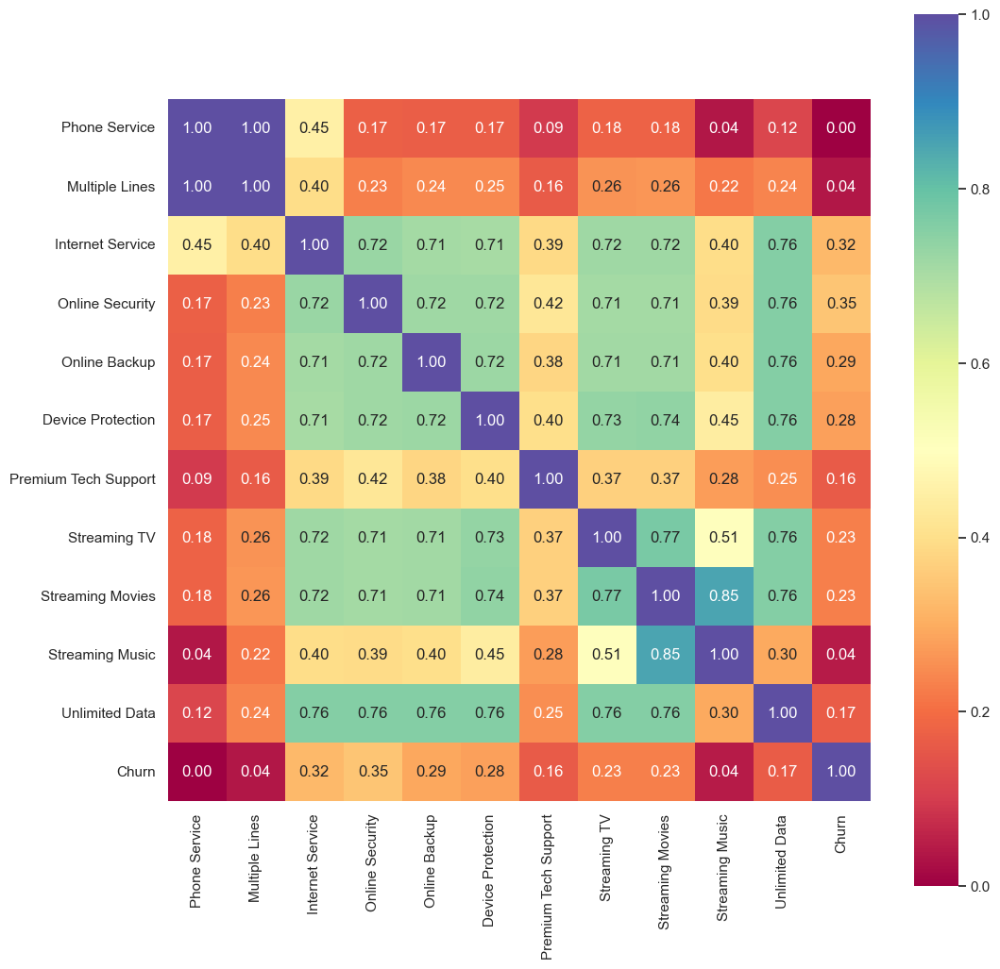

In [80]:
# categoric assosiation 
cat_corr= get_corr_mat(df[serv + ['Churn']])
plt.figure(figsize=(12,12))
sns.heatmap(cat_corr,cbar=True, annot=True, fmt='.2f', square=True, annot_kws={'size': 12}, cmap=cmp)
plt.show();

### 1. “Churn” Column:
- Internet Service (0.32) and Online Security (0.35) have the highest correlation with “Churn”, meaning that customers with Internet service and online security may influence their churn.

- Streaming TV (0.23) and Streaming Movies (0.23) are also correlated, but less strongly.

- Phone Service (0.00) has almost no impact on churn.

#### High correlation between related services:

- Streaming TV (0.77) ↔ Streaming Movies (0.77): Those who subscribe to online TV are more likely to also subscribe to online movies.

- Online Security (0.72) ↔ Internet Service (0.72): Security services are often bundled with Internet service.
- Online Backup, Device Protection, Premium Tech Support have a medium correlation (0.38 - 0.45) with each other, indicating that these are complementary services that customers may choose together.

#### Low correlation pairs:

- Phone Service (-0.00) ↔ Churn: Phone service does not affect the decision to leave the network.

- Streaming Music (0.04) ↔ Churn: Digital music service also does not affect the rate of leaving the network much.

### 2. Business implications

Reduce churn:
- Focus on Internet Service, Online Security, Streaming TV/Movies, as customers using these services tend to leave the network more.

- Provide incentives for customers using services that are highly correlated with churn to retain them.

Suitable service packages: 

- Provide combined service packages such as Streaming TV + Streaming Movies or Online Security + Internet Service to increase value for customers.

# **7. Modelling**

## Baseline Model


The baseline model is used as a comparison to see whether there is an improvement after treatment.

In [81]:
models = [
    ['LogReg', LogisticRegression(random_state=42, max_iter=1000,verbose=0 )],
    ['XGB', xgb.XGBClassifier()],
    ['SVC', SVC(random_state=42,verbose=0)],
    ['CatBoost',CatBoostClassifier(random_state=42, verbose=0)]
]

# remove Churn category feature
categoric_var= [i for i in categoric_var if i!='Churn Category']

# dataset splitting
X = df[numeric_var + categoric_var]
y = df['Churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y) # stratify = y, digunakan untuk menjaga proporsi target tetap sama antara X_train dan X_test
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape )

# Encode all classified data into digital data
e = Pipeline([('ordinal_encoder', OrdinalEncoder())]) 
ct = ColumnTransformer([
    ('encoder', OrdinalEncoder(),categoric_var)
],remainder='passthrough')

# # cross validation
cv_df = [] 
for name, j in models:
    model_pipe = Pipeline([('ct',ct),('model',j)])
    score = cross_validate(model_pipe,X_train,y_train,cv=10,return_train_score=False, scoring=['roc_auc','f1','recall','precision'])
    mean_score = [] 
    for i in score.values(): 
        mean_score.append(round(np.mean(i),3)) 
    cv_df.append(pd.DataFrame({'Attribute':[i for i in score.keys()], f'{name}':mean_score }))
score_before = pd.DataFrame(columns=['Attribute'])
for i in cv_df:
    score_before = score_before.merge(right=i,on='Attribute', how='outer')
score_before = score_before.loc[2:].reset_index(drop=True) 

(5977, 34) (1055, 34) (5977,) (1055,)


In [82]:
score_before

,Attribute,LogReg,XGB,SVC,CatBoost
0,test_f1,0.645,0.643,0.000,0.652
1,test_precision,0.672,0.679,0.000,0.706
2,test_recall,0.621,0.612,0.000,0.607
3,test_roc_auc,0.874,0.877,0.798,0.892


🧐 Conclusion
- CatBoost is the best model, as it has the highest F1-score, Precision and ROC-AUC.
- XGB and Logistic Regression also perform quite well but are a bit worse than CatBoost.
- SVC is not suitable, as it fails to predict the Churn class (Precision, Recall = 0).

# **8. Filter-Based Feature Selection**


Feature Selection is the process of selecting relevant features for modeling needs, there are several approaches, namely: filter based, wrapper-based, and embedded. this time I will try to show some Filter Based Feature Selection techniques such as Anova, Chi2, and Mutual Information. Filter based feature selection is a feature selection technique that considers the relationship between features and target variables. The Feature Selection below is just a demonstration, because later the Feature selection that we will use is Mutual Information which is entered into the pipeline.

### Function

In [83]:
# code in this line is a collection of functions that I will use for feature selection and visualization needs

# function for feature selection
# to perform anova feature selection, enter the f_classif parameter for classification, and f_regression for regression
# while for mutual information, mutual_info_classif for classification, mutual_info_regression for regression
def select_features(X_train, y_train, X_test,method,k):
    fs = SelectKBest(score_func=method, k=k)# setting the number of features to be retrieved
    fs.fit(X_train, y_train) #  learn relationships from training data
    X_train_fs = fs.transform(X_train) # transform data train
    X_test_fs = fs.transform(X_test) # transform data test
    return X_train_fs, X_test_fs, fs
# function visualisasi feature selection
def viz_feature_select(var,feature_selection_score,title_,height):
    df = pd.DataFrame({'Variable':var,'Score':[round(i,2) for i in feature_selection_score]}).sort_values(by='Score', ignore_index=True,ascending=False)
    df['Color'] = main_color[0] 
    df['Color'][:5] = main_color[1] # top 5 kolom terbaik, bedakan warnanya
    fig = go.Figure([go.Bar(y=df['Variable'], x=df['Score'],text= [ '{a} (%{b})'.format(a=i,b=j) for i, j in zip(df['Score'],[round((i / df['Score'].sum())* 100,2) for i in df['Score']])],
                            textposition='outside',
                            marker={'color': df['Color']},
                            orientation='h')]) 
    fig.update_layout(autosize=False,width=1200,height=height,margin=dict(l=10,r=10,b=10,t=40,pad=0),xaxis_range=[0,df['Score'].max() + (df['Score'].max()/2)],
            title=dict(text=title_,font=dict(size=20),x=0.5),
            yaxis={'categoryorder':'array','categoryarray':df.sort_values(by='Score', ascending=True)['Variable'].to_list()}, template='plotly_white')  
    return df,fig

# report for classification
def get_classification_report(y_test, y_pred, y_pred_proba_pos):

    ## Classification Report
    df_report = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose().reset_index().set_axis(['Attribute','Precision','Recall','F1-Score','Support'],axis=1).round(3).reset_index(drop=True)
    bucket = []
    for i,j in enumerate(df_report['Support']):
        if i == 2:
            bucket.append(str(j))
        else:
            bucket.append(str(int(j)))
    bucket2 = df_report.loc[2] 
    df_report['Support'] = bucket
    df_report['Attribute']=['0','1','Accurary','Macro Avg','Weighted Avg']
    df_report.loc[2] = ['Accuracy','','',bucket2[3],df_report['Support'].loc[4]]

    classification_report_viz = go.Figure(data=[go.Table(
        header=dict(values=list(df_report.columns),line_color='black',fill_color=main_color[0],align='center',font=dict(color='white', size=14),height=30),
        cells=dict(values=[df_report['Attribute'],df_report['Precision'], df_report['Recall'], df_report['F1-Score'], df_report['Support']],line_color='black',fill=dict(color=[main_color[1],'#F4F4F2','#F4F4F2','#F4F4F2']),align='center',font_size=14,height=30))
    ]).update_layout(
        width=750, 
        height=250,
        margin=dict(l=10,r=10,b=10,t=40,pad=10), 
        title={'text': "Classification Report",'y':0.96,'x':0.5,'xanchor': 'center','yanchor': 'top'})
    
    # ROC AUC Plot
    fpr, tpr, threshold = roc_curve(y_test, y_pred_proba_pos, pos_label=1)
    j = tpr - fpr 
    ix = np.argmax(j)
    best_threshold = threshold[ix]
    df_roc_auc = pd.DataFrame({'True Positive Rate':tpr,'False Positive Rate':fpr,'threshold':threshold})
    df_roc_auc['threshold'] =[round(i,4) for i in df_roc_auc['threshold']]
    auc_score = roc_auc_score(y_test, y_pred_proba_pos)
    roc_auc_viz = go.Figure()
    roc_auc_viz.add_shape(type='line', line=dict(dash='dash', color='black',width=3),x0=0, x1=1, y0=0, y1=1)
    roc_auc_viz.add_trace(go.Scatter(x=df_roc_auc['False Positive Rate'], y=df_roc_auc['True Positive Rate'],mode='lines',text=df_roc_auc['threshold'],
        hovertemplate=
            "<b>Threshold: %{text}</b><br>" +
            "<b>False Positive Rate: %{x:.4f}</b><br>" +
            "<b>True Positive Rate: %{y:.4f}</b><br>" +
            "<extra></extra>",
        marker = dict(color = main_color[1], size=5),line=dict( width=3)))
    roc_auc_viz.update_layout(xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',yaxis=dict(scaleanchor="x", scaleratio=1),xaxis=dict(constrain='domain'),width=750, height=550,plot_bgcolor='white',margin=dict(l=60,r=40,b=10,t=60,pad=10), title={'text': f"ROC-CURVE (AUC={round(auc_score,4)})",'y':0.96,'x':0.5,'xanchor': 'center','yanchor': 'top'})
    roc_auc_viz.update_xaxes(mirror=True,ticks='outside',showline=True,linecolor='black',gridcolor='lightgrey')
    roc_auc_viz.update_yaxes(mirror=True,ticks='outside',showline=True,linecolor='black',gridcolor='lightgrey')

    # Confusion Matrix
    cm = confusion_matrix(y_test,y_pred,labels=[0,1]) 
    df_confusion_matrix = pd.DataFrame(cm).set_axis(['Not Churn','Churn'],axis=0).set_axis(['Not Churn','Churn'],axis=1)
    df_confusion_matrix.index.name = 'True Label'
    df_confusion_matrix.columns.name = 'Predicted Label'
    confusion_matrix_viz = px.imshow(img=df_confusion_matrix,text_auto=True,color_continuous_scale=cmp).update_traces(
        hovertemplate = None,hoverinfo = "skip").update_layout(
            height=450,width=750,margin=dict(l=10,r=10,b=10,t=50,pad=0), title={'text': 'Confusion Matrix','y':0.96,'x':0.5,'xanchor': 'center','yanchor': 'top'},font=dict( size=15))
    return [confusion_matrix_viz,classification_report_viz,roc_auc_viz ,best_threshold]

# **9. Initial Pipeline**

The initial pipeline is a temporary pipeline which can later change depending on conditions.

In [84]:
# dataset splitting
X = df[numeric_var + categoric_var]
y = df['Churn']

# First change the Total Refunds and Total Extra Data Charge features to ordinal categories
X['Total Refunds'] = X['Total Refunds'].apply(lambda i: 'No' if i==0 else 'Yes') 
X['Total Extra Data Charges'] = X['Total Extra Data Charges'].apply(lambda i: 'No' if i==0 else 'Yes') 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, stratify=y) # stratify = y, digunakan untuk menjaga proporsi target tetap sama antara X_train dan X_test
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape )

# variables that contain outliers are divided into 3 because they are handled differently
out_var1 = ['Number of Dependents']
out_var2 = ['Total Refunds','Total Extra Data Charges']
out_var3 = ['Number of Referrals','Total Long Distance Charges','Avg Monthly GB Download','Total Revenue','Cust_Score']
# new numeric variable
numeric_var_new = [i for i in numeric_var  if i not in out_var2]

# {key : [[ordinal variable],[ordinal variable order]]}
ord_= {'ord1':[['Senior Citizen','Married','Dependents','Referred a Friend','Phone Service','Premium Tech Support','Streaming Music','Unlimited Data','Paperless Billing','Total Refunds','Total Extra Data Charges'],['No', 'Yes']],
       'ord2':[['Online Security','Online Backup','Device Protection','Streaming TV','Streaming Movies'],['No internet service','No', 'Yes']],
       'ord3':[['Multiple Lines'],['No phone service','No','Yes']],
       'ord4':[ ['Internet Service'],['No','DSL','Fiber optic']],
       'ord5':[['Contract'],['Month-to-month', 'One year', 'Two year']],
       'ord6':[['Payment Method'],['Mailed Check','Bank Withdrawal','Credit Card'] ]
       }
# variable ordinal
ordinal_var = []
for i in ord_.keys():
    ordinal_var = ordinal_var + ord_[i][0]
# ordinal order categories
ord_categories = []
for i in ord_.keys():
    ord_categories = ord_categories + [ord_[i][1]]*len(ord_[i][0])

# variable nominal
nominal_var = ['Gender','Offer']

# Model
models = [
    ['LogReg', LogisticRegression(random_state=42, max_iter=1000,verbose=0 )],
    ['XGB', xgb.XGBClassifier()],
    ['SVC', SVC(random_state=42,verbose=0)],
    ['CatBoost',CatBoostClassifier(random_state=42, verbose=0)]
]

# function that will be inserted into the Custom function
def func_handling_outlier(X_train):
    # handling outlier variable 1
    X_train['Number of Dependents'] = X_train['Number of Dependents'].apply(lambda i: 3 if i>3 else i) 
    # handling outlier variable 3
    out_var3 = ['Number of Referrals','Total Long Distance Charges','Avg Monthly GB Download','Total Revenue','Cust_Score']
    # upper bound
    upper_bound = []
    for i in out_var3:
        upper_bound.append( int(find_outliers_IQR(df[i])[2]) ) 
    # change data that passes the upperbound to NaN
    for i,j in zip(out_var3,upper_bound):    
        X_train.loc[X_train[X_train[i]>j].index.to_list(),i] = np.NaN
    # NaN data is imputed using KNN Imputer
    imputer = KNNImputer(n_neighbors=7) 
    X_train[out_var3] = imputer.fit_transform(X_train[out_var3])
    X_train[out_var3] = X_train[out_var3]
    return X_train[numeric_var_new+ordinal_var+nominal_var]

# custom pipeline for outlier handling
hand_outliers = ColumnTransformer([
    ('handling_outlier',FunctionTransformer(func_handling_outlier),numeric_var_new+ordinal_var+nominal_var)
    ]) 

# SMOTEENN to overcome data imbalance
smote_enn = SMOTEENN( random_state=42)

# variable name index for the 3 pipes below
idx_numeric_var = []
idx_nominal_var = []
idx_ordinal_var = []
for i,j in enumerate(numeric_var_new+ordinal_var+nominal_var):
    if j in numeric_var_new:
        idx_numeric_var.append(i)
    elif j in nominal_var:
        idx_nominal_var.append(i)
    else:
        idx_ordinal_var.append(i)

# 1. numeric pipe
power = PowerTransformer(method='yeo-johnson')
scaler = MinMaxScaler()
numeric_pipe = Pipeline([('power', power),('scaler', scaler)])

# 2. ordinal pipe
ordinal_encoder = OrdinalEncoder(categories = ord_categories)
ordinal_pipe = Pipeline([('ordinal_encoder', ordinal_encoder),('scaler',scaler)]) 

# 3. Nominal pipe
nominal_encoder = OneHotEncoder(drop='first')
nominal_pipe = Pipeline([('nominal_encoder', nominal_encoder)])

# preprocessing 
prep_var = ColumnTransformer([
    ('numeric_pipe', numeric_pipe, idx_numeric_var),
    ('ordinal_pipe', ordinal_pipe, idx_ordinal_var),
    ('nominal_pipe', nominal_pipe, idx_nominal_var)
]) 

# preprocessor pipeline
preprocessor = Pipeline([
    ('hand',hand_outliers),
    ('prep',prep_var)
])

preprocessor_smote = imbpipeline([
    ('hand',hand_outliers),
    ('prep',prep_var),
    ('smote',smote_enn)
])
# feature name after transform
tranf_var_name = numeric_var_new+ordinal_var+list(nominal_pipe.fit(X_train[nominal_var]).get_feature_names_out())


(5977, 34) (1055, 34) (5977,) (1055,)


# **10. ANOVA Feature Selection**

Anova feature selection is used to sort out relevant features for modeling by utilizing the F value. The F value is obtained by dividing the variance between groups by the variance within groups. The larger the F value, the better the feature is for predicting the target variable.

In [85]:

#For test data, we need to fit the train data first, then transform the test 
preprocessor.fit(X_train, y_train)
X_test_trans = preprocessor.transform(X_test)
# train data, we use a pipeline that has smote in it
X_train_trans , y_train_trans = preprocessor_smote.fit_resample(X_train,y_train) 

X_train_fs, X_test_fs, fs = select_features(X_train_trans, y_train_trans, X_test_trans ,f_classif,'all')
viz_feature_select(tranf_var_name,fs.scores_,'ANOVA Feature Selection',1000)[1].show() 
df_anova = pd.DataFrame({'Var':tranf_var_name,'Anova Score':[round(i,2) for i in fs.scores_]}).sort_values(by='Anova Score', ignore_index=True,ascending=True).head(10)
display(df_anova )  

,Var,Anova Score
0,Phone Service,0.02
1,Avg Monthly Long Distance Charges,0.06
2,Offer_Offer D,3.16
3,Gender_Male,3.97
4,Multiple Lines,13.72
5,Offer_Offer C,25.38
6,Total Refunds,40.18
7,Streaming Music,41.63
8,Services_Usage,46.36
9,Online Security,48.52


# **12. Chi2 Feature Selection**

Chi2 Feature Selection utilizes the relationship between the target variable and the independent variable of categorical data type. The concept is the same as finding the correlation between a numeric target and a numeric feature. If a feature has an association with the target, its value will be greater.

In [86]:
X_train_fs, X_test_fs, fs = select_features(X_train_trans[:,len(numeric_var)-2:], y_train_trans, X_test_trans[:,len(numeric_var)-2:], chi2,'all') 
nominal_name = list(nominal_pipe.fit(X_train[nominal_var]).get_feature_names_out())
# visualization
viz_feature_select(ordinal_var+nominal_name,fs.scores_,'Chi2 Feature Selection',900)[1].show()
df_chi2 = pd.DataFrame({'Var':ordinal_var+nominal_name,'Chi2 Score':[round(i,2) for i in fs.scores_]}).sort_values(by='Chi2 Score', ignore_index=True,ascending=True).head(10)
display(df_chi2)

,Var,Chi2 Score
0,Phone Service,0.00
1,Multiple Lines,1.95
2,Gender_Male,2.02
3,Offer_Offer D,2.80
4,Online Security,9.04
5,Offer_Offer C,23.29
6,Streaming Music,25.84
7,Device Protection,35.08
8,Total Refunds,35.66
9,Online Backup,37.50


# **13. Mutual Information Feature Selection**

Mutual Information is used as feature selection because it is more flexible than ANOVA and Chi2. ANOVA is limited to X numeric - y categorical, Chi2 X categorical - y categorical, Mutual Information does not depend on the data type.

In [87]:
X_train_fs, X_test_fs, fs = select_features(X_train_trans, y_train_trans, X_test_trans , mutual_info_classif,'all')
viz_feature_select(tranf_var_name,fs.scores_,'Mutual Information Feature Selection',1200)[1].show()
df_mi = pd.DataFrame({'Var':tranf_var_name,'Mutual Information Score':fs.scores_}).sort_values(by='Mutual Information Score', ignore_index=True,ascending=True).head(10)
display(df_mi)

,Var,Mutual Information Score
0,Avg Monthly Long Distance Charges,0.002770
1,Phone Service,0.006797
2,Offer_Offer C,0.007072
3,Streaming Music,0.009306
4,Offer_Offer D,0.011880
5,Total Refunds,0.012035
6,Gender_Male,0.012134
7,Total Extra Data Charges,0.015922
8,Offer_Offer B,0.024355
9,Offer_Offer A,0.028938


In [88]:
offer_map = {'None':0,'Offer D':1,'Offer C':2,'Offer B':3,'Offer A':4,'Offer E':5} 
df['Offer'] = df['Offer'].copy().map(offer_map) 

Previously we did not know whether the offer type had a level (ordinal) or not due to the lack of information from the dataset source, but from the feature selection, offers E and A have good importance, offers D and C are the opposite, so we will do feature engineering to change the value to numeric

### Pipeline

In [89]:

# {key : [[ordinal variable],[ordinal variable order]]}
ord_= {'ord1':[['Senior Citizen','Married','Dependents','Referred a Friend','Phone Service','Premium Tech Support','Streaming Music','Unlimited Data','Paperless Billing','Total Refunds','Total Extra Data Charges'],['No', 'Yes']],
       'ord2':[['Online Security','Online Backup','Device Protection','Streaming TV','Streaming Movies'],['No internet service','No', 'Yes']],
       'ord3':[['Multiple Lines'],['No phone service','No','Yes']],
       'ord4':[ ['Internet Service'],['No','DSL','Fiber optic']],
       'ord5':[['Contract'],['Month-to-month', 'One year', 'Two year']],
       'ord6':[['Payment Method'],['Mailed Check','Bank Withdrawal','Credit Card'] ],
       'ord7':[['Offer'],['None','Offer D','Offer C','Offer B','Offer A','Offer E']]
       }
# variable ordinal
ordinal_var = []
for i in ord_.keys():
    ordinal_var = ordinal_var + ord_[i][0]
# ordinal order categories
ord_categories = []
for i in ord_.keys():
    ord_categories = ord_categories + [ord_[i][1]]*len(ord_[i][0]) 

nominal_var = ['Gender'] 

idx_numeric_var = []
idx_ordinal_var = []
idx_nominal_var = []
for i,j in enumerate(numeric_var_new+ordinal_var+nominal_var):
    if j in numeric_var_new:
        idx_numeric_var.append(i)
    elif j in ordinal_var:
        idx_ordinal_var.append(i)
    else:
        idx_nominal_var.append(i)

# 2. ordinal pipe
ordinal_encoder = OrdinalEncoder(categories = ord_categories)
ordinal_pipe = Pipeline([('ordinal_encoder', ordinal_encoder),('scaler',scaler)]) 

# 3. Nominal pipe
nominal_encoder = OneHotEncoder(drop='first')
nominal_pipe = Pipeline([('nominal_encoder', nominal_encoder)])

# preprocessing 
prep_var = ColumnTransformer([
    ('numeric_pipe', numeric_pipe, idx_numeric_var),
    ('ordinal_pipe', ordinal_pipe, idx_ordinal_var),
    ('nominal_pipe', nominal_pipe, idx_nominal_var)
]) 

# feature name setelah transform
tranf_var_name = numeric_var_new+ordinal_var+list(nominal_pipe.fit(X_train[nominal_var]).get_feature_names_out())

## Cross Validation

We will try to compare between imbalance dataset handling techniques, between SMOTE and Class Weight, which one has a better score for this dataset?
- note: I use SMOTE ENN, this technique combines up sampling and under sampling methods

We will also use Mutual Information in the Pipeline to filter features. percentile = 95, meaning use the best 95% of all existing columns.

### A. Class Weight

In [90]:
# weight
weights = compute_class_weight('balanced', classes=np.array([0, 1]), y=y_train)
class_weights = dict(zip([0,1], weights)) # untuk catboost
scale_pos_weight= y_train.value_counts()[0] / y_train.value_counts()[1] # untuk xgb

# Model class weight
models = [
    ['LogReg', LogisticRegression(random_state=42, max_iter=1000,verbose=0 ,class_weight='balanced')],
    ['XGB', xgb.XGBClassifier(scale_pos_weight=scale_pos_weight)],
    ['SVC', SVC(random_state=42,verbose=0 ,class_weight='balanced')],
    ['CatBoost',CatBoostClassifier(random_state=42, verbose=0,class_weights=class_weights)]
]

# preprocessor pipeline
preprocessor = Pipeline([
    ('hand',hand_outliers),
    ('prep',prep_var),
    ('selection',SelectPercentile(mutual_info_classif, percentile=95)) 
])

# cross validation class weight
cv_df = [] 
for name, j in models:
    model_pipe = Pipeline([ ('prep',preprocessor),('model',j)])
    score = cross_validate(model_pipe,X_train,y_train,cv=10,return_train_score=False, scoring=['roc_auc','f1','recall','precision'])
    mean_score = [] 
    for i in score.values(): 
        mean_score.append(round(np.mean(i),3)) 
    cv_df.append(pd.DataFrame({'Attribute':[i for i in score.keys()], f'{name}':mean_score }))
score_after = pd.DataFrame(columns=['Attribute']) 
for i in cv_df:
    score_after = score_after.merge(right=i,on='Attribute', how='outer')
score_after = score_after.loc[2:].reset_index(drop=True)  



In [91]:
# Score Class Weight
score_after

,Attribute,LogReg,XGB,SVC,CatBoost
0,test_f1,0.672,0.647,0.668,0.687
1,test_precision,0.567,0.610,0.558,0.607
2,test_recall,0.824,0.690,0.834,0.792
3,test_roc_auc,0.882,0.871,0.880,0.889


### B. SMOTE

In [92]:

# model smote
models_smote = [
    ['LogReg', LogisticRegression(random_state=42, max_iter=1000,verbose=0 )],
    ['XGB', xgb.XGBClassifier()],
    ['SVC', SVC(random_state=42,verbose=0 ,)],
    ['CatBoost',CatBoostClassifier(random_state=42, verbose=0)]
]

# cross validation smote
cv_df = [] 
for name, j in models_smote:
# use pipe line from imblearn if you want to combine sklearn and SMOTE
    model_pipe= imbpipeline([
        ('hand',hand_outliers),
        ('prep',prep_var),
        ('smote', smote_enn),
        ('selection',SelectPercentile(mutual_info_classif, percentile=95)),('model',j)
        ]) 
    score = cross_validate(model_pipe,X_train,y_train,cv=10,return_train_score=False, scoring=['roc_auc','f1','recall','precision'])
    mean_score = [] 
    for i in score.values(): 
        mean_score.append(round(np.mean(i),3)) 
    cv_df.append(pd.DataFrame({'Attribute':[i for i in score.keys()], f'{name}':mean_score }))
score_after_smote = pd.DataFrame(columns=['Attribute']) 
for i in cv_df:
    score_after_smote = score_after_smote.merge(right=i,on='Attribute', how='outer')
score_after_smote = score_after_smote.loc[2:].reset_index(drop=True)  

In [93]:
# Score SMOTE
score_after_smote

,Attribute,LogReg,XGB,SVC,CatBoost
0,test_f1,0.642,0.656,0.641,0.660
1,test_precision,0.502,0.545,0.509,0.546
2,test_recall,0.889,0.825,0.867,0.835
3,test_roc_auc,0.875,0.873,0.866,0.878


Class Weight looks better by about 1%-2%, for that we will use the Class Weight technique

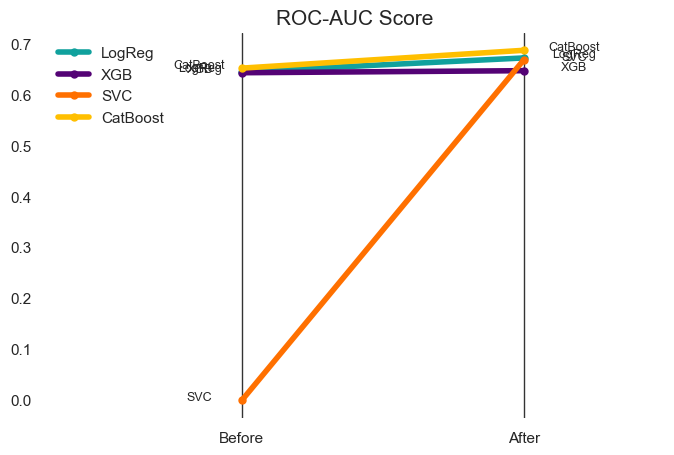

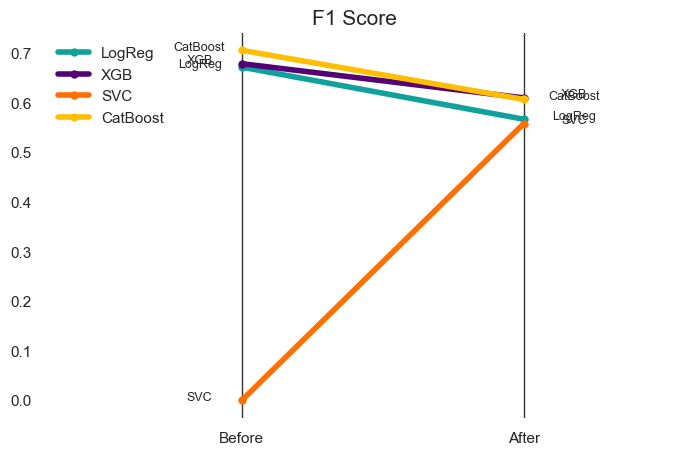

In [94]:
# data manipulation for visualization of score before after
score_after2 = score_after.T.reset_index().set_axis(score_after.T.reset_index().loc[0],axis=1).loc[1:].set_axis(['Attribute','ROC-AUC','F1','Recall','Precision'],axis=1)
score_before2 = score_before.T.reset_index().set_axis(score_before.T.reset_index().loc[0],axis=1).loc[1:].set_axis(['Attribute','ROC-AUC','F1','Recall','Precision'],axis=1)
bucket = []
for i in score_after2['Attribute']:
    bucket.append( pd.DataFrame({'Model':i,'Metrics':score_after2.columns[1:],'Score':score_after2[score_after2['Attribute']==i].iloc[:,1:].values[0]}) )
bucket2 = []
for i in score_before2['Attribute']:
    bucket2.append( pd.DataFrame({'Model':i,'Metrics':score_before2.columns[1:],'Score':score_before2[score_before2['Attribute']==i].iloc[:,1:].values[0]}) )
score_after3 = pd.concat(bucket, ignore_index=True)
score_before3 = pd.concat(bucket2, ignore_index=True)


before_after ={'before':[],'after':[]}
color_discrete_map = {'ROC-AUC':'#10A19D','F1':'#540375','Recall':'#FF7000','Precision':'#FFBF00'}
for i,j,z in zip(before_after.keys(),[score_before3,score_after3],['Sebelum Preprocessing','Sesudah Preprocessing']):
    before_after[i] = px.histogram(j, x="Model", y='Score',color='Metrics', barmode='group',height=400, text_auto=True,color_discrete_map=color_discrete_map).update_layout(height=450,margin=dict(l=10,r=10,b=10,t=50,pad=0), title={'text': z,'y':0.96,'x':0.5,'xanchor': 'center','yanchor': 'top'},font=dict( size=15), template='plotly_white')
before_after['before'].show()
before_after['after'].show()

bf = score_before2.copy()
af = score_after2.copy()
bf['Status'] = 0
af['Status'] = 1
ba = pd.concat([bf,af], ignore_index=True)

colors = ['#10A19D', '#540375', '#FF7000', '#FFBF00']#, '#A3333D','black']
for j in ba.columns[1:3].tolist():
    mod_name = ba['Attribute'].unique().tolist()
    fig, ax = plt.subplots(1, figsize=(8,5), facecolor='w')
    ax.set_facecolor('w') 
    for i,k in zip(mod_name,colors):
        temp = ba[ba['Attribute']==i]
        plt.plot(temp['Status'], temp[j], marker='o', markersize=5,lw=4, color=k)
        plt.text(temp['Status'].values[0]-0.15, temp[j].values[0], i, ha='center', size=9)
        plt.text(temp['Status'].values[1]+0.18, temp[j].values[1], i, ha='center',size=9)
    plt.xlim(0-0.7,1+0.5)
    ax.set_xticks([0,1],['Before','After'])
    plt.title(f'{j} Score', loc='Center', fontsize=15) 
    # grid
    ax.xaxis.grid(color='black', linestyle='solid', which='both', alpha=0.8)
    # remove spines
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False) 
    ax.spines['top'].set_visible(False)
    plt.legend(mod_name, loc='upper left', frameon=False)
    plt.show() 

Dengan menggunakan lebih sedikit Feature kita bisa menghasilkan model yang sama bagusnya, untuk skor ROC-AUC mayoritas cenderung sama saja, hanya SVC yang mengalami peningkatan signifikan, hal yang sama juga berlaku untuk F1 score. Score Recall dan Precision nantinya akan kita atur menggunakan Threshold Tuning sesuai kebutuhan bisnis.

## Hyperparameter Tuning 

untuk mempersingkat waktu, kita hanya akan menggunakan 4 model saja.

In [95]:
model_param = {'LogReg':[{'algo__fit_intercept': [True, False],'algo__C': np.array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])}, LogisticRegression(random_state=42, max_iter=1000,verbose=0 ,class_weight='balanced')],
               'SVC':[{'algo__gamma': np.array([1.e-03, 1.e-02, 1.e-01]),'algo__C': np.array([ 1.e+01, 1.e+02, 1.e+03])}, SVC(random_state=42,probability=True,class_weight='balanced')],
               'XGB':[{'algo__max_depth': [ 6,8],'algo__colsample_bytree': [0.3, 0.4],'algo__n_estimators': [ 130,140],'algo__gamma': [5,10]}, xgb.XGBClassifier(scale_pos_weight=scale_pos_weight)],
               'CatBoost':[{'algo__depth':[3,4],'algo__n_estimators':[95,96,97],'algo__learning_rate':[0.1]},CatBoostClassifier(random_state=42, verbose=0,class_weights=class_weights)]
               }
model_col = []
gs_score = [] 
for i,j in model_param.items():
    model_pipe = Pipeline([ ('prep',preprocessor),('algo',j[1])])
    param = j[0]
    model = GridSearchCV(estimator=model_pipe,param_grid=param, cv=10, scoring='roc_auc', n_jobs=-1, verbose=0)
    model.fit(X_train, y_train)
    gs_score.append({'model':i,'best score':model.best_score_,'best params':model.best_params_,'estimator':model.best_estimator_}) 
    model_col.append(model)

In [96]:
gs_df = pd.DataFrame(gs_score, columns=['model','best score','best params','estimator']).sort_values(by='best score',ignore_index=True,ascending=False)
best_estimator = gs_df.iloc[0,3]
gs_df 

,model,best score,best params,estimator
0,CatBoost,0.890997,"{'algo__depth': 4, 'algo__learning_rate': 0.1,...",((ColumnTransformer(transformers=[('handling_o...
1,SVC,0.889824,"{'algo__C': 100.0, 'algo__gamma': 0.01}",((ColumnTransformer(transformers=[('handling_o...
2,XGB,0.887852,"{'algo__colsample_bytree': 0.3, 'algo__gamma':...",((ColumnTransformer(transformers=[('handling_o...
3,LogReg,0.886494,"{'algo__C': 1000.0, 'algo__fit_intercept': False}",((ColumnTransformer(transformers=[('handling_o...


In [97]:
# classification report best model (CatBoost)
est = best_estimator
test_pred = est.predict(X_test)
test_pred_proba = est.predict_proba(X_test)
probs = test_pred_proba[:, 1]

get_classification_report(y_test,test_pred,probs)[0].show() 
get_classification_report(y_test,test_pred,probs)[1].show() 
get_classification_report(y_test,test_pred,probs)[2].show() 

CatBoost memiliki Score ROC-UAC tertinggi, untuk itu kita akan menggunakannya sebagai model. berikut adalah gambaran alur pipelinenya.

In [98]:
model_col[3]

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('prep',
                                        Pipeline(steps=[('hand',
                                                         ColumnTransformer(transformers=[('handling_outlier',
                                                                                          FunctionTransformer(func=<function func_handling_outlier at 0x175414d60>),
                                                                                          ['Age',
                                                                                           'Number '
                                                                                           'of '
                                                                                           'Dependents',
                                                                                           'Number '
                                                                                           'of '
                                                                                           'Referrals',
                                                                                           'Tenure '
                                                                                           'Months',
                                                                                           'Avg '
                                                                                           'Monthly '
                                                                                           'Long '
                                                                                           'Distance '
                                                                                           'Charges',
                                                                                           'Avg '
                                                                                           'Monthly '
                                                                                           'GB '
                                                                                           'Download',
                                                                                           'Monthly...
                                                                                          Pipeline(steps=[('nominal_encoder',
                                                                                                           OneHotEncoder(drop='first'))]),
                                                                                          [33])])),
                                                        ('selection',
                                                         SelectPercentile(percentile=95,
                                                                          score_func=<function mutual_info_classif at 0x157968360>))])),
                                       ('algo',
                                        <catboost.core.CatBoostClassifier object at 0x172512690>)]),
             n_jobs=-1,
             param_grid={'algo__depth': [3, 4], 'algo__learning_rate': [0.1],
                         'algo__n_estimators': [95, 96, 97]},
             scoring='roc_auc')

## Voting Classifier 

Berdasarkan hasil dari Hyperparameter tuning diatas, Catboost muncul sebagai model terbaik. Namun sebelum masuk ketahap selanjutnya, kita akan coba satu eksperimen lagi, yaitu dengan melakukan Voting Classifier, cara kerja Voting Classifier adalah dengan menggabungkan probabilitas prediksi antar model lalu merata-ratakannya, dan rata-rata itulah yang digunakan sebagai prediksi.

In [99]:
vc = VotingClassifier([
    (gs_df.iloc[0,0],gs_df.iloc[0,3]),
    (gs_df.iloc[1,0],gs_df.iloc[1,3]),
    (gs_df.iloc[2,0],gs_df.iloc[2,3]),
    ],voting='soft')
param_vc = {'weights':[(1,1,1),(2,1,1),(1,2,1),(1,1,2)]}
grid_vc = GridSearchCV(estimator=vc,param_grid=param_vc,cv=10, scoring='roc_auc', n_jobs=-1, verbose=0)
grid_vc.fit(X_train,y_train) 

GridSearchCV(cv=10,
             estimator=VotingClassifier(estimators=[('CatBoost',
                                                     Pipeline(steps=[('prep',
                                                                      Pipeline(steps=[('hand',
                                                                                       ColumnTransformer(transformers=[('handling_outlier',
                                                                                                                        FunctionTransformer(func=<function func_handling_outlier at 0x175414d60>),
                                                                                                                        ['Age',
                                                                                                                         'Number '
                                                                                                                         'of '
                                                                                                                         'Dependents',
                                                                                                                         'Number '
                                                                                                                         'of '
                                                                                                                         'Referrals',
                                                                                                                         'Tenure '
                                                                                                                         'Months',
                                                                                                                         'Avg '
                                                                                                                         'Monthly '
                                                                                                                         'Long '
                                                                                                                         'Distance '
                                                                                                                         'Charg...
                                                                                    max_cat_threshold=None,
                                                                                    max_cat_to_onehot=None,
                                                                                    max_delta_step=None,
                                                                                    max_depth=8,
                                                                                    max_leaves=None,
                                                                                    min_child_weight=None,
                                                                                    missing=nan,
                                                                                    monotone_constraints=None,
                                                                                    multi_strategy=None,
                                                                                    n_estimators=140,
                                                                                    n_jobs=None,
                                                                                    num_parallel_tree=None,
                                                                                    random_state=None, ...))]))],
                                        voting='soft'),
             n_jobs=-1,
             param_grid={'weights': [(1, 1, 1), (2, 1, 1), (1, 2, 1),
                                     (1, 1, 2)]},
             scorin

In [100]:
est = grid_vc.best_estimator_
test_pred = est.predict(X_test)
test_pred_proba = est.predict_proba(X_test)
probs = test_pred_proba[:, 1]

get_classification_report(y_test,test_pred,probs)[0].show()
get_classification_report(y_test,test_pred,probs)[1].show() 
get_classification_report(y_test,test_pred,probs)[2].show()

Voting Classifier menunjukkan adanya peningkatan score, f1 score yang sebelumnya 65 menjadi 68 untuk kelas positive, kita akan menggunakan voting classifier sebagai model final.

## Probability Threshold Tuning

We assume that the company is no longer in the growth stage, its brand is well-known, and it has a large customer base. If this is the case, then it is more appropriate if the customer retention campaign is given a larger budget proportion than customer acquisition.

To retain customers, we need a model with high Recall metrics because False Negative (FN) has a more damaging impact than False Positive (FP), FN is a condition where we predict that a customer will not churn but in fact he/she churns, the effect of lowering FN is that FP will increase because there is a trade-off between FN and FP if the data is imbalanced, if you want to lower FN, the optimal threshold is between 0 and 0.5.

Considering the cost of acquiring customers is [five times](https://www.hashgrowth.org/articles/acquisition-vs-retention-choosing-the-right-strategy/#:~:text=The%20debate%20around%20customer%20acquisition,keep%20coming%20back%20for%20more) more expensive than retaining existing customers, and increasing customer retention by 5% can increase profits by 25% to 95%. Based on the article above, we can make a simple calculation assumption as follows:
we separate the retention campaign into 3 categories: category 1 is customers with a churn probability between threshold and <0.6
- category 1 = predicted probability >= threshold to <0.6 . at risk of churn. retention campaign cost 1$

- category 2 = predicted probability >= 0.6 to <0.8. moderate churn risk. retention campaign cost 2$

- category 3 = predicted probability >0.8 to 1. high churn risk. retention campaign cost 3$

- cost of customer churn / acquisition cost wasted due to churn = average retention campaign times five = 2 * 5 = 10$

The challenge is to find the right threshold, we want a low FN, but still pay attention to the FP cost or the high retention campaign cost due to threshold tuning, and the FN cost itself or the cost of losing customers where we need 5 times more expensive to make acquisitions to replace churned customers.

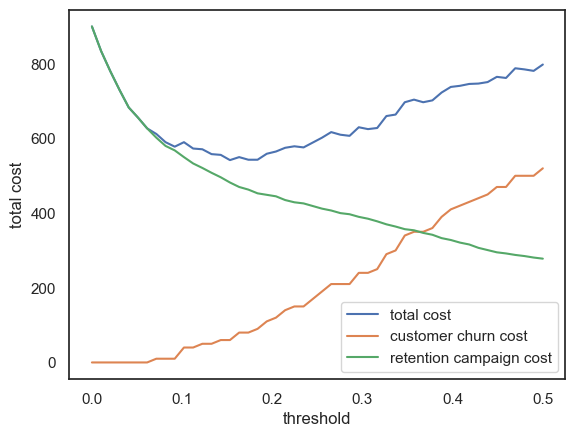

In [101]:
a = []
b = []
c = []

for i in np.linspace(0,0.5,50):
    thl = i 
    bucket_risk = []
    for i in probs:
        if (i >=thl) & ( i <0.6):
            bucket_risk.append(1)
        elif (i >=0.6) & ( i <0.8):
            bucket_risk.append(2)
        elif (i >=0.8) & ( i <1):
            bucket_risk.append(3)
        else:
            bucket_risk.append(0)
    risk_df = pd.DataFrame({'churn':y_test.to_numpy(),'pred':(probs >= thl).astype('int'),'risk category':bucket_risk})
    ret_cam_cost = risk_df[(risk_df['pred']==1)&(risk_df['churn']==0)]['risk category'].sum()
    cust_ch_cost = risk_df[(risk_df['pred']==0)&(risk_df['churn']==1)].shape[0]*10
    total_cost = ret_cam_cost+cust_ch_cost
    a.append(ret_cam_cost)
    b.append(cust_ch_cost) 
    c.append(total_cost)
cost_df = pd.DataFrame({'threshold':np.linspace(0,0.5,50),'retention campaign cost':a,'customer churn cost':b,'total cost':c})#.sort_values(by='total cost',ignore_index=True).head()

sns.lineplot(data=cost_df,x='threshold',y='total cost' ,label='total cost')
sns.lineplot(data=cost_df,x='threshold',y='customer churn cost',label='customer churn cost')
sns.lineplot(data=cost_df,x='threshold',y='retention campaign cost',label='retention campaign cost');  

In [102]:
cost_df.iloc[np.argmin(cost_df['total cost'])]

threshold                    0.153061
retention campaign cost    482.000000
customer churn cost         60.000000
total cost                 542.000000
Name: 15, dtype: float64

In [103]:
# classification report menggunakan threshold yang baru 
est = grid_vc.best_estimator_
test_pred = est.predict(X_test)
test_pred_proba = est.predict_proba(X_test) 
probs = test_pred_proba[:, 1]
thl = cost_df.iloc[np.argmin(cost_df['total cost'])][0]
get_classification_report(y_test,(probs >= thl).astype('int'),probs)[0].show()
get_classification_report(y_test,(probs >= thl).astype('int'),probs)[1].show() 

## SHAP

In [104]:
shap.initjs()

# siapkan pipeline
preprocessor_shap = Pipeline([('hand',hand_outliers),('prep',prep_var)])
# ambil parameter terbaik untuk catboost
p= {}
for i,j in gs_df.iloc[0,2].items():
    p[i[ 6:]] = j
# fit data train lalu transform data test
preprocessor_shap.fit(X_train)
X_train_trans= pd.DataFrame(preprocessor_shap.fit_transform(X_train)).set_axis(tranf_var_name,axis=1)
X_test_trans= pd.DataFrame(preprocessor_shap.transform(X_test)).set_axis(tranf_var_name,axis=1)    
# fit modelnya
clf = CatBoostClassifier(**p, verbose=0)
clf.fit(X_train_trans, y_train,plot=False) 
# hitung shap value
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test_trans)

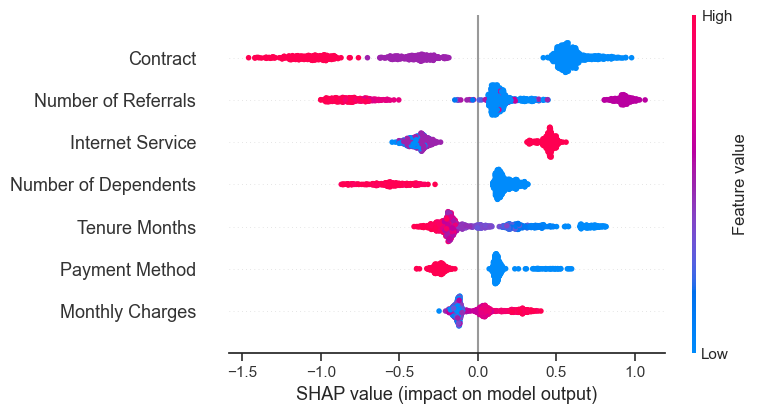

In [105]:
# dibawah ini adalah list 7 feature yang paling signifikan dalam mempengaruhi orang untuk churn atau tidak, darimana saya tahu? karena saya sudah plotting semua feature sebelumnya, dan inilah yang terbaik :p
selected_feat = ['Contract','Number of Referrals','Internet Service','Number of Dependents','Tenure Months','Payment Method','Monthly Charges'] 
shap.summary_plot(pd.DataFrame(shap_values).set_axis(tranf_var_name,axis=1)[selected_feat].to_numpy(), X_test_trans[selected_feat]) 


# Summary

Insights and recommendations from SHAP plot:

- Contract & Monthly Charges

Customers who choose a 'Two year' contract have a high chance of not churn. While the 'Month-to-month' contract has the opposite effect. This is related to the Monthly Charges feature, where the higher the monthly fee, the greater the chance of customers to churn. To overcome this, companies need to rearrange their pricing strategies for their products to minimize the chance of churn for customers who choose the 'Month-to-month' contract.

- Number of Referrals

The more 'Number of Referrals', the greater the chance of customers not to churn. Give customers who make a lot of referrals special attention, because the number of referrals shows that they feel confident with the services the company offers, give rewards if they succeed in making referrals n times and let the power of word of mouth help marketing in carrying out its duties. Rewards are also useful for luring customers who make few referrals to make referrals.

- Internet Service

If customers use 'fiber optic' internet services, the chances of customers churn are greater. Based on insights from EDA that have been conducted, competitors are the biggest reason why people who use fiber optics churn, companies are required to optimize their fiber optic products so that they can compete more with competitor products.

- Number of Dependents

The greater the 'Number of Dependents', the greater the chances of customers not to churn. Marketing can conduct campaigns to customers who are married rather than single, and try to improve sales strategies so that single customers are more interested in the products offered.

- Tenure Months

The higher the 'Tenure Months', the greater the chance of customers not to churn, a large 'Tenure Months' indicates that our product has been well received by customers, and marketing needs to improve retention campaign strategies so that tenure months are greater

- Payment Method,

Customers who use the mailed check payment method tend to churn, mailed checks are a fairly old-fashioned payment method, it is likely that customers like this are technologically illiterate, so they cannot utilize our services properly, marketing needs to provide additional education for customers like this so that their potential for churn is reduced.

The three biggest reasons why customers churn are due to Competitors, Attitude, and Dissatisfaction. Companies are good at retaining customers with large transactions, but are not good at retaining customers with low transactions, when customers want to try a product, they are likely not to spend a lot of money right away, this is the part that companies need to fix, high monthly charges also tend to make customers churn (based on SHAP value). Plus Attitude and Dissatisfaction are the second biggest causes of customer churn, companies need to fix the recruitment section so that the quality of human resources is maintained which will have an impact on increasing the level of satisfaction. Companies also need to create products that can be accepted by all groups, based on the analysis above, single customers who do not have dependents tend to churn, meaning that so far marketing strategies have been more successful with customers who are married or have dependents only but are less effective in attracting single customers.

[Al Fath Terry](https://www.linkedin.com/in/al-fath-terry/)